## This notebook is intended to load processed EXAFS data and construct a 'botom up' model via specific path selection and parameter linking. 

In [1]:
# step 0: imports
import sys
sys.path.insert(0, r"C:\Users\kwill\Keenan_UCB-O365\OneDrive_UCB-O365\GitHub_Repos\xraylarch")
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
from scipy.interpolate import interp1d
from larch.io import read_athena, read_ascii
from larch.xafs import (pre_edge, autobk, xftf, 
                        ff2chi, feffpath, feffit_transform, feffit_dataset, feffit, feffit_report, TransformGroup, path2chi)
from larch.fitting import param, guess, param_group
from larch.plot.plotly_xafsplots import (plot_mu, plot_chik, plot_chir, plot_chifit, 
                                         multi_plot, plotlabels, set_label_weight)
from larch.utils import group2dict
from pathlib import Path
from larch.wxlib import plotlabels as plab 
from scipy.signal import savgol_filter   
try:
    # Try the newer name first
    from scipy.integrate import simpson as integrate_method
except ImportError:
    try:
        # Try the older name
        from scipy.integrate import simps as integrate_method
    except ImportError:
        # Fall back to trapz which is always available
        from scipy.integrate import trapz as integrate_method
        print("Note: Using trapz for integration instead of simpson/simps")      
import matplotlib.cm as cm  
from larch import Group                                
import os 

from larch.XASmu2r import XASmu2r
from larch.XAFSfit import XAFSfit
# initialize the fit object with the directory containing the processed Athena files
cspbi3_fit = XAFSfit(
    Path(r'C:\Users\kwill\Keenan_UCB-O365\OneDrive - UCB-O365\Data\XAS\NSLS-II\AthenaProjectFiles\CsPbI3\low_noise\processed')
)



LOAD PROCESSED CHECKPOINT SUMMARY
  Processed folder:  C:\Users\kwill\Keenan_UCB-O365\OneDrive - UCB-O365\Data\XAS\NSLS-II\AthenaProjectFiles\CsPbI3\low_noise\processed
  Checkpoint file:   C:\Users\kwill\Keenan_UCB-O365\OneDrive - UCB-O365\Data\XAS\NSLS-II\AthenaProjectFiles\CsPbI3\low_noise\processed\processed_checkpoint.pkl
  Projects loaded:   11
  Groups loaded:     20


## Bottom-Up Iterative Fitting Procedure
### By Iteration:
##### First: Add Pb-I scattering path and plot fit summary
##### Second: Add Pb-O scattering path and plot fit summary
##### Second (replacement): Reevaluate all Pb-I paths, then Pb-O for better fit and plot fit summary
##### Third: Add Pb-S scattering path with parameters linked to Pb-O and plot fit summary
##### Third (replacement): Reevaluate all Pb-O, Pb-I, and Pb-S scattering paths for better fit and plot fit summary
##### Fourth: Add Pb-C scattering path with parameters linked to Pb-O
##### Fourth (replacement): Reevaluate Pb-O, Pb-S, Pb-I, and Pb-C for better fit and plot fit summary
##### Fifth: Add linked multiple scattering and plot fit summary
##### Fifth (final): Reevaluate All paths in model, relax e0 in arguement and plot fit summary and publication figure.   


In [2]:
feff_dir = r'C:/Users/kwill/.larch/feff' 


Searching for and analyzing Pb-I FEFF paths in C:\Users\kwill\.larch\feff
Found 819 Pb-I FEFF paths.

Detailed information about Pb-I paths:
Index  Type   Reff     Deg    n-leg  Label
--------------------------------------------------------------------------------
     1 ss     2.689 Å      1      2  Pb-I SS: 2.689Å
     2 ss     2.812 Å      1      2  Pb-I SS: 2.812Å
     3 ss     2.819 Å      1      2  Pb-I SS: 2.819Å
     4 ss     2.843 Å      1      2  Pb-I SS: 2.843Å
     5 ss     2.881 Å      1      2  Pb-I SS: 2.881Å
     6 ss     2.890 Å      1      2  Pb-I SS: 2.890Å
     7 ss     2.891 Å      1      2  Pb-I SS: 2.891Å
     8 ss     2.899 Å      1      2  Pb-I SS: 2.899Å
     9 ss     2.899 Å      1      2  Pb-I SS: 2.899Å
    10 ss     2.923 Å      1      2  Pb-I SS: 2.923Å
    11 ss     2.924 Å      1      2  Pb-I SS: 2.924Å
    12 ss     2.924 Å      1      2  Pb-I SS: 2.924Å
    13 ss     2.924 Å      1      2  Pb-I SS: 2.924Å
    14 ss     2.932 Å      1      2  Pb-I SS:

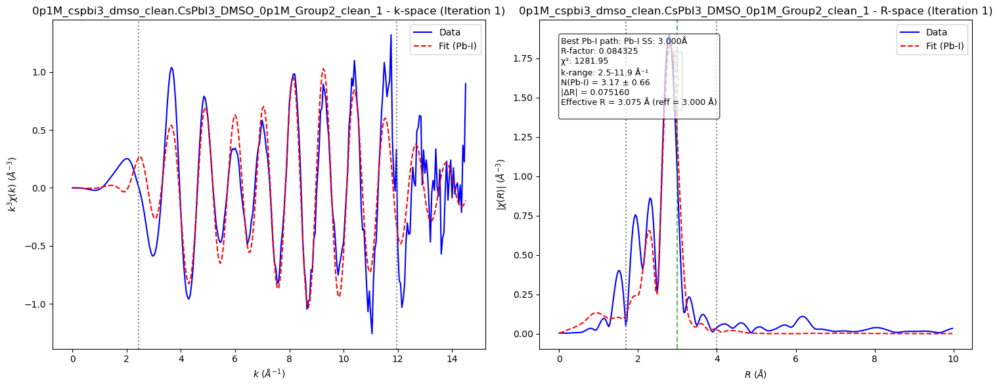


Processing Group: 0p1M_cspbi3_dmso_clean.CsPbI3_DMSO_0p1M_Group1_clean_smooth

Processing group: 0p1M_cspbi3_dmso_clean.CsPbI3_DMSO_0p1M_Group1_clean_smooth
Creating Fourier Transform parameters for unknown...
  Found optimized kmin = 2.45 (from ft_processing_batch)
  Found optimized kmax = 11.85 (from ft_processing_batch)
  Using rbkg reference = 1.06 A
  Using fit rmin = 1.72 A (detected)
  Created transform with k-range: 2.45 to 11.85 Å⁻¹, kw=3
Evaluating 25 Pb-I paths for 0p1M_cspbi3_dmso_clean.CsPbI3_DMSO_0p1M_Group1_clean_smooth...
Building parameter group for iteration 1...
  Created parameters for iteration 1: <Param Group 0x248cea54230>
  Path 1: Pb-I SS: 2.812Å - |ΔR|: 0.200, R-factor: 1.020697
Building parameter group for iteration 1...
  Created parameters for iteration 1: <Param Group 0x248d3205700>
  Path 2: Pb-I SS: 2.843Å - |ΔR|: 0.200, R-factor: 1.085886
Building parameter group for iteration 1...
  Created parameters for iteration 1: <Param Group 0x248d322fdd0>
  Pat

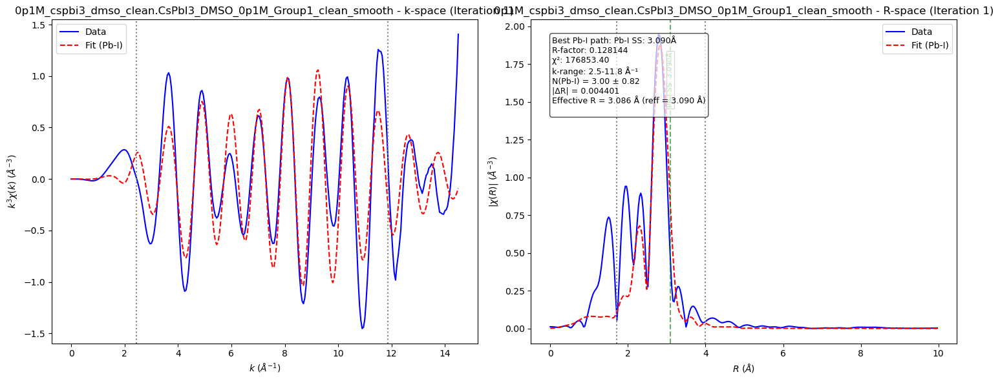


Processing Group: 0p1M_cspbi3_dmso_clean.CsPbI3_DMSO_0p1m_Group3_clean_deconv

Processing group: 0p1M_cspbi3_dmso_clean.CsPbI3_DMSO_0p1m_Group3_clean_deconv
Creating Fourier Transform parameters for unknown...
  Found optimized kmin = 2.35 (from ft_processing_batch)
  Found optimized kmax = 11.95 (from ft_processing_batch)
  Using rbkg reference = 1.06 A
  Using fit rmin = 1.69 A (detected)
  Created transform with k-range: 2.35 to 11.95 Å⁻¹, kw=3
Evaluating 25 Pb-I paths for 0p1M_cspbi3_dmso_clean.CsPbI3_DMSO_0p1m_Group3_clean_deconv...
Building parameter group for iteration 1...
  Created parameters for iteration 1: <Param Group 0x248d2105160>
  Path 1: Pb-I SS: 2.812Å - |ΔR|: 0.200, R-factor: 1.012659
Building parameter group for iteration 1...
  Created parameters for iteration 1: <Param Group 0x248d0a33080>
  Path 2: Pb-I SS: 2.843Å - |ΔR|: 0.102, R-factor: 1.135226
Building parameter group for iteration 1...
  Created parameters for iteration 1: <Param Group 0x248d3722150>
  Pat

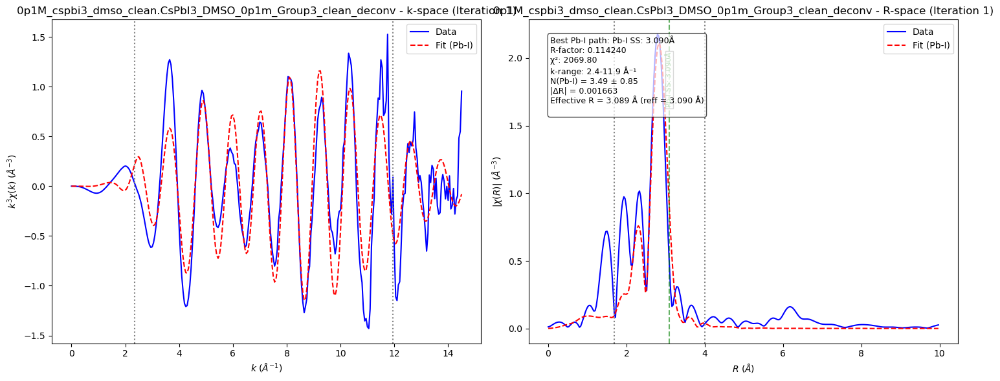


Processing Project: 0p2M_cspbi3_dmso_clean

Processing Group: 0p2M_cspbi3_dmso_clean.CsPbI3_DMSO_0p2M_Group1_clean

Processing group: 0p2M_cspbi3_dmso_clean.CsPbI3_DMSO_0p2M_Group1_clean
Creating Fourier Transform parameters for unknown...
  Found optimized kmin = 2.40 (from ft_processing_batch)
  Found optimized kmax = 11.75 (from ft_processing_batch)
  Using rbkg reference = 1.06 A
  Using fit rmin = 1.66 A (detected)
  Created transform with k-range: 2.40 to 11.75 Å⁻¹, kw=3
Evaluating 25 Pb-I paths for 0p2M_cspbi3_dmso_clean.CsPbI3_DMSO_0p2M_Group1_clean...
Building parameter group for iteration 1...
  Created parameters for iteration 1: <Param Group 0x248d4923b30>
  Path 1: Pb-I SS: 2.812Å - |ΔR|: 0.049, R-factor: 1.108372
Building parameter group for iteration 1...
  Created parameters for iteration 1: <Param Group 0x248d3620e60>
  Path 2: Pb-I SS: 2.843Å - |ΔR|: 0.088, R-factor: 1.110360
Building parameter group for iteration 1...
  Created parameters for iteration 1: <Param Gro

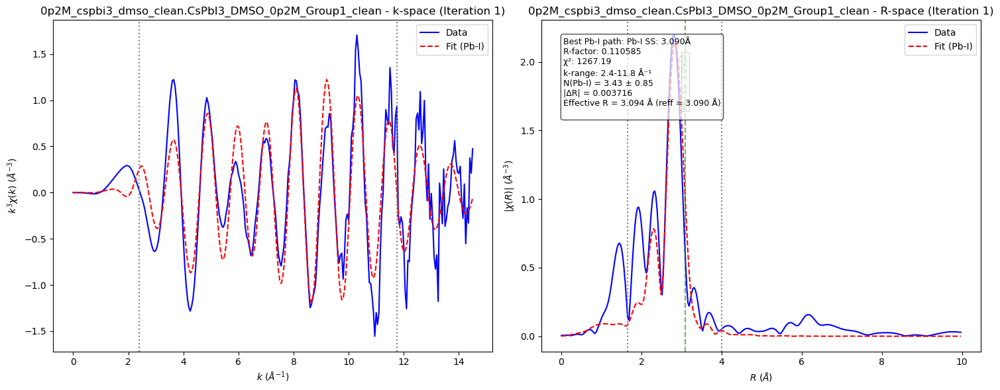


Processing Group: 0p2M_cspbi3_dmso_clean.CsPbI3_DMSO_0p2M_Group2

Processing group: 0p2M_cspbi3_dmso_clean.CsPbI3_DMSO_0p2M_Group2
Creating Fourier Transform parameters for unknown...
  Found optimized kmin = 2.45 (from ft_processing_batch)
  Found optimized kmax = 11.80 (from ft_processing_batch)
  Using rbkg reference = 1.06 A
  Using fit rmin = 1.66 A (detected)
  Created transform with k-range: 2.45 to 11.80 Å⁻¹, kw=3
Evaluating 25 Pb-I paths for 0p2M_cspbi3_dmso_clean.CsPbI3_DMSO_0p2M_Group2...
Building parameter group for iteration 1...
  Created parameters for iteration 1: <Param Group 0x248d49c8ef0>
  Path 1: Pb-I SS: 2.812Å - |ΔR|: 0.050, R-factor: 1.124752
Building parameter group for iteration 1...
  Created parameters for iteration 1: <Param Group 0x248d328d370>
  Path 2: Pb-I SS: 2.843Å - |ΔR|: 0.088, R-factor: 1.120055
Building parameter group for iteration 1...
  Created parameters for iteration 1: <Param Group 0x248d3331430>
  Path 3: Pb-I SS: 2.881Å - |ΔR|: 0.120, R-f

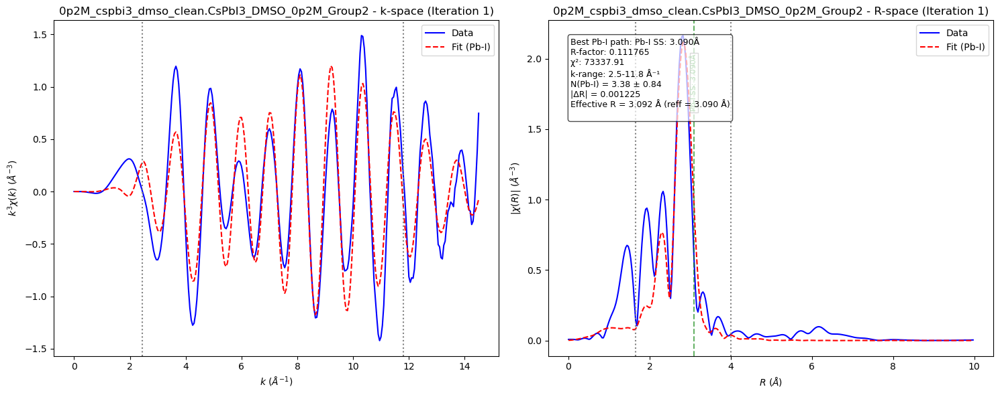


Processing Project: 0p3M_cspbi3_dmso_clean

Processing Group: 0p3M_cspbi3_dmso_clean.CsPbI3_DMSO_0p3M_Group1

Processing group: 0p3M_cspbi3_dmso_clean.CsPbI3_DMSO_0p3M_Group1
Creating Fourier Transform parameters for unknown...
  Found optimized kmin = 2.40 (from ft_processing_batch)
  Found optimized kmax = 11.85 (from ft_processing_batch)
  Using rbkg reference = 1.06 A
  Using fit rmin = 1.69 A (detected)
  Created transform with k-range: 2.40 to 11.85 Å⁻¹, kw=3
Evaluating 25 Pb-I paths for 0p3M_cspbi3_dmso_clean.CsPbI3_DMSO_0p3M_Group1...
Building parameter group for iteration 1...
  Created parameters for iteration 1: <Param Group 0x248d310aa50>
  Path 1: Pb-I SS: 2.812Å - |ΔR|: 0.059, R-factor: 1.131332
Building parameter group for iteration 1...
  Created parameters for iteration 1: <Param Group 0x248d1eda060>
  Path 2: Pb-I SS: 2.843Å - |ΔR|: 0.096, R-factor: 1.132172
Building parameter group for iteration 1...
  Created parameters for iteration 1: <Param Group 0x248d1eb0e60>


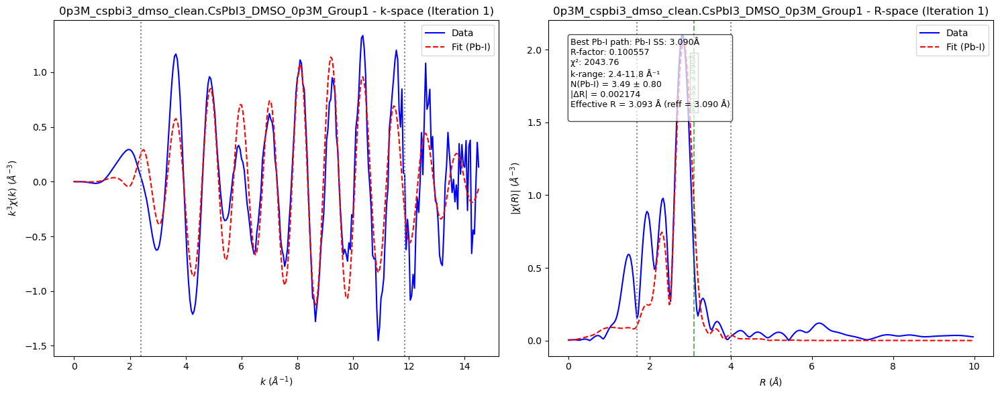


Processing Project: 0p4M_cspbi3_dmso_clean

Processing Group: 0p4M_cspbi3_dmso_clean.CsPbI3_DMSO_0p4M_Group1

Processing group: 0p4M_cspbi3_dmso_clean.CsPbI3_DMSO_0p4M_Group1
Creating Fourier Transform parameters for unknown...
  Found optimized kmin = 2.45 (from ft_processing_batch)
  Found optimized kmax = 11.80 (from ft_processing_batch)
  Using rbkg reference = 1.06 A
  Using fit rmin = 1.69 A (detected)
  Created transform with k-range: 2.45 to 11.80 Å⁻¹, kw=3
Evaluating 25 Pb-I paths for 0p4M_cspbi3_dmso_clean.CsPbI3_DMSO_0p4M_Group1...
Building parameter group for iteration 1...
  Created parameters for iteration 1: <Param Group 0x248d1e2c0b0>
  Path 1: Pb-I SS: 2.812Å - |ΔR|: 0.067, R-factor: 1.127156
Building parameter group for iteration 1...
  Created parameters for iteration 1: <Param Group 0x248d49a5700>
  Path 2: Pb-I SS: 2.843Å - |ΔR|: 0.103, R-factor: 1.131301
Building parameter group for iteration 1...
  Created parameters for iteration 1: <Param Group 0x248d1e2dd30>


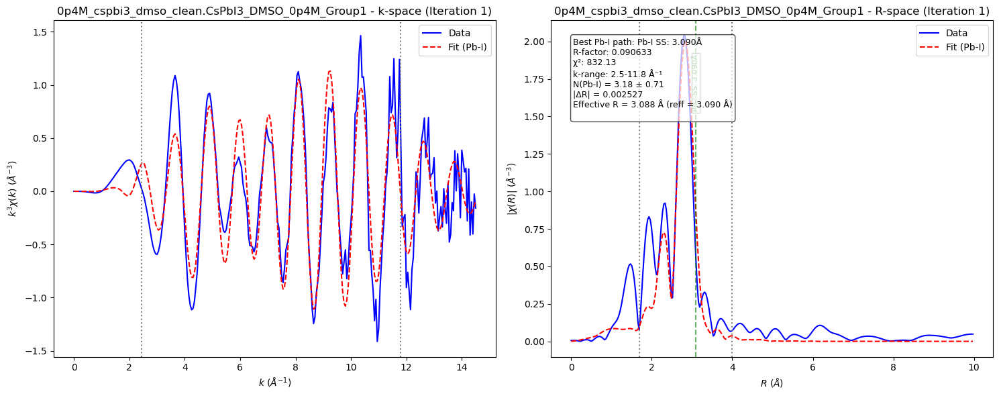


Processing Group: 0p4M_cspbi3_dmso_clean.CsPbI3_DMSO_0p4M_Group2

Processing group: 0p4M_cspbi3_dmso_clean.CsPbI3_DMSO_0p4M_Group2
Creating Fourier Transform parameters for unknown...
  Found optimized kmin = 2.45 (from ft_processing_batch)
  Found optimized kmax = 11.85 (from ft_processing_batch)
  Using rbkg reference = 1.06 A
  Using fit rmin = 1.69 A (detected)
  Created transform with k-range: 2.45 to 11.85 Å⁻¹, kw=3
Evaluating 25 Pb-I paths for 0p4M_cspbi3_dmso_clean.CsPbI3_DMSO_0p4M_Group2...
Building parameter group for iteration 1...
  Created parameters for iteration 1: <Param Group 0x248d4ad4710>
  Path 1: Pb-I SS: 2.812Å - |ΔR|: 0.200, R-factor: 1.024226
Building parameter group for iteration 1...
  Created parameters for iteration 1: <Param Group 0x248d4af8e60>
  Path 2: Pb-I SS: 2.843Å - |ΔR|: 0.105, R-factor: 1.142233
Building parameter group for iteration 1...
  Created parameters for iteration 1: <Param Group 0x248d4b52150>
  Path 3: Pb-I SS: 2.881Å - |ΔR|: 0.200, R-f

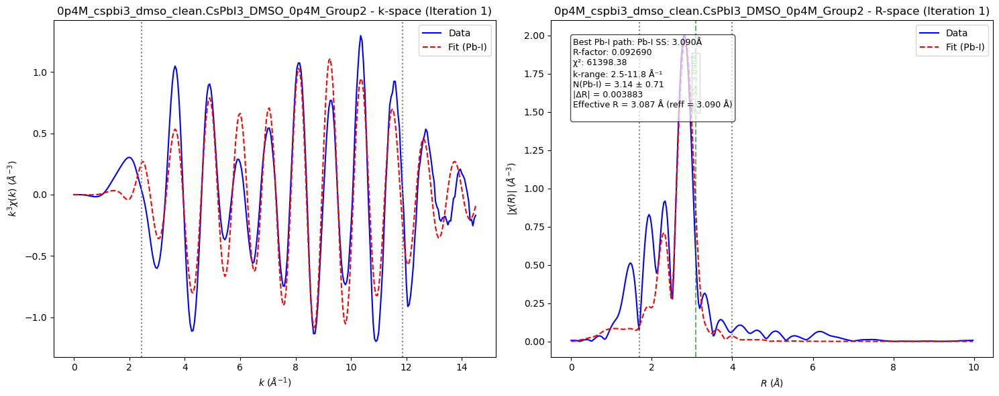


Processing Project: 0p5M_cspbi3_dmso_clean

Processing Group: 0p5M_cspbi3_dmso_clean.CsPbI3_DMSO_0p5M_Group1

Processing group: 0p5M_cspbi3_dmso_clean.CsPbI3_DMSO_0p5M_Group1
Creating Fourier Transform parameters for unknown...
  Found optimized kmin = 2.40 (from ft_processing_batch)
  Found optimized kmax = 11.75 (from ft_processing_batch)
  Using rbkg reference = 1.06 A
  Using fit rmin = 1.69 A (detected)
  Created transform with k-range: 2.40 to 11.75 Å⁻¹, kw=3
Evaluating 25 Pb-I paths for 0p5M_cspbi3_dmso_clean.CsPbI3_DMSO_0p5M_Group1...
Building parameter group for iteration 1...
  Created parameters for iteration 1: <Param Group 0x248d20888f0>
  Path 1: Pb-I SS: 2.812Å - |ΔR|: 0.055, R-factor: 1.132608
Building parameter group for iteration 1...
  Created parameters for iteration 1: <Param Group 0x248d1e02600>
  Path 2: Pb-I SS: 2.843Å - |ΔR|: 0.092, R-factor: 1.129217
Building parameter group for iteration 1...
  Created parameters for iteration 1: <Param Group 0x248d328c3e0>


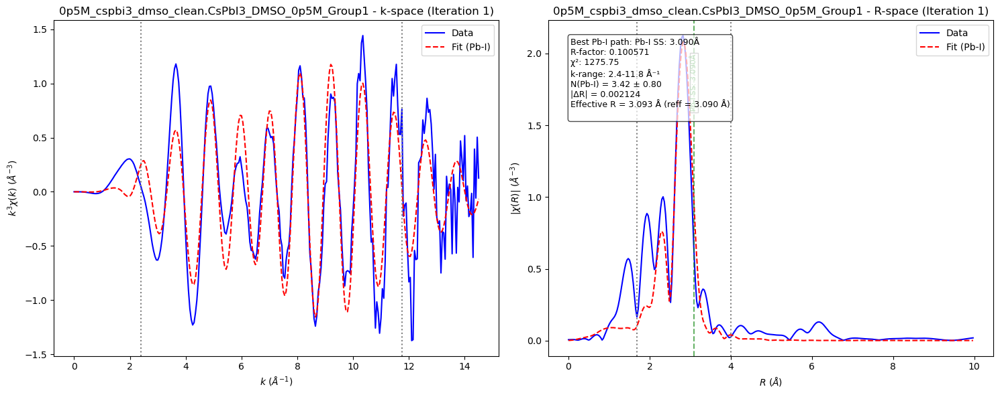


Processing Group: 0p5M_cspbi3_dmso_clean.CsPbI3_DMSO_0p5M_Group2

Processing group: 0p5M_cspbi3_dmso_clean.CsPbI3_DMSO_0p5M_Group2
Creating Fourier Transform parameters for unknown...
  Found optimized kmin = 2.45 (from ft_processing_batch)
  Found optimized kmax = 11.80 (from ft_processing_batch)
  Using rbkg reference = 1.06 A
  Using fit rmin = 1.69 A (detected)
  Created transform with k-range: 2.45 to 11.80 Å⁻¹, kw=3
Evaluating 25 Pb-I paths for 0p5M_cspbi3_dmso_clean.CsPbI3_DMSO_0p5M_Group2...
Building parameter group for iteration 1...
  Created parameters for iteration 1: <Param Group 0x248d5d56540>
  Path 1: Pb-I SS: 2.812Å - |ΔR|: 0.056, R-factor: 1.139842
Building parameter group for iteration 1...
  Created parameters for iteration 1: <Param Group 0x248d36a2060>
  Path 2: Pb-I SS: 2.843Å - |ΔR|: 0.092, R-factor: 1.134958
Building parameter group for iteration 1...
  Created parameters for iteration 1: <Param Group 0x248d32b82c0>
  Path 3: Pb-I SS: 2.881Å - |ΔR|: 0.128, R-f

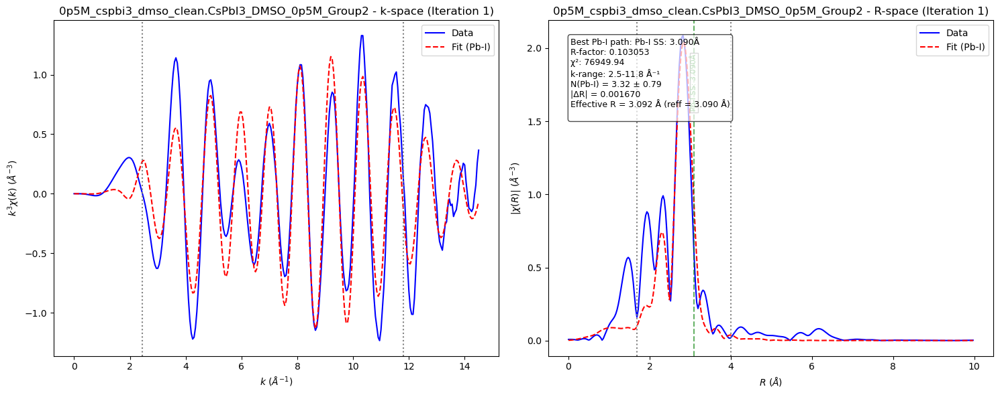


Processing Project: 0p6M_cspbi3_dmso_clean

Processing Group: 0p6M_cspbi3_dmso_clean.CsPbI3_DMSO_0p6M_Group1

Processing group: 0p6M_cspbi3_dmso_clean.CsPbI3_DMSO_0p6M_Group1
Creating Fourier Transform parameters for unknown...
  Found optimized kmin = 2.35 (from ft_processing_batch)
  Found optimized kmax = 11.75 (from ft_processing_batch)
  Using rbkg reference = 1.18 A
  Using fit rmin = 1.69 A (detected)
  Created transform with k-range: 2.35 to 11.75 Å⁻¹, kw=3
Evaluating 25 Pb-I paths for 0p6M_cspbi3_dmso_clean.CsPbI3_DMSO_0p6M_Group1...
Building parameter group for iteration 1...
  Created parameters for iteration 1: <Param Group 0x248d47c7530>
  Path 1: Pb-I SS: 2.812Å - |ΔR|: 0.200, R-factor: 1.032692
Building parameter group for iteration 1...
  Created parameters for iteration 1: <Param Group 0x248d36a1dc0>
  Path 2: Pb-I SS: 2.843Å - |ΔR|: 0.200, R-factor: 1.124832
Building parameter group for iteration 1...
  Created parameters for iteration 1: <Param Group 0x248d33ba090>


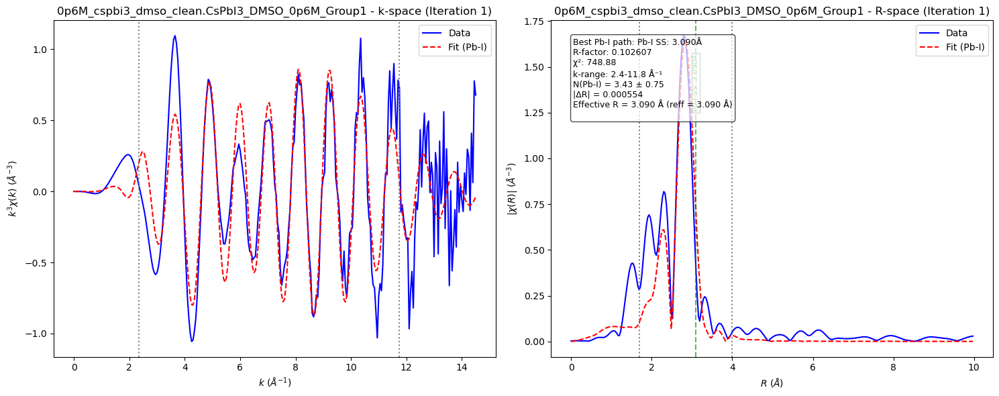


Processing Group: 0p6M_cspbi3_dmso_clean.CsPbI3_DMSO_0p6M_Group2

Processing group: 0p6M_cspbi3_dmso_clean.CsPbI3_DMSO_0p6M_Group2
Creating Fourier Transform parameters for unknown...
  Found optimized kmin = 2.40 (from ft_processing_batch)
  Found optimized kmax = 11.85 (from ft_processing_batch)
  Using rbkg reference = 1.18 A
  Using fit rmin = 1.69 A (detected)
  Created transform with k-range: 2.40 to 11.85 Å⁻¹, kw=3
Evaluating 25 Pb-I paths for 0p6M_cspbi3_dmso_clean.CsPbI3_DMSO_0p6M_Group2...
Building parameter group for iteration 1...
  Created parameters for iteration 1: <Param Group 0x248d5edb590>
  Path 1: Pb-I SS: 2.812Å - |ΔR|: 0.200, R-factor: 1.041032
Building parameter group for iteration 1...
  Created parameters for iteration 1: <Param Group 0x248d3108320>
  Path 2: Pb-I SS: 2.843Å - |ΔR|: 0.200, R-factor: 1.132274
Building parameter group for iteration 1...
  Created parameters for iteration 1: <Param Group 0x248d4877290>
  Path 3: Pb-I SS: 2.881Å - |ΔR|: 0.200, R-f

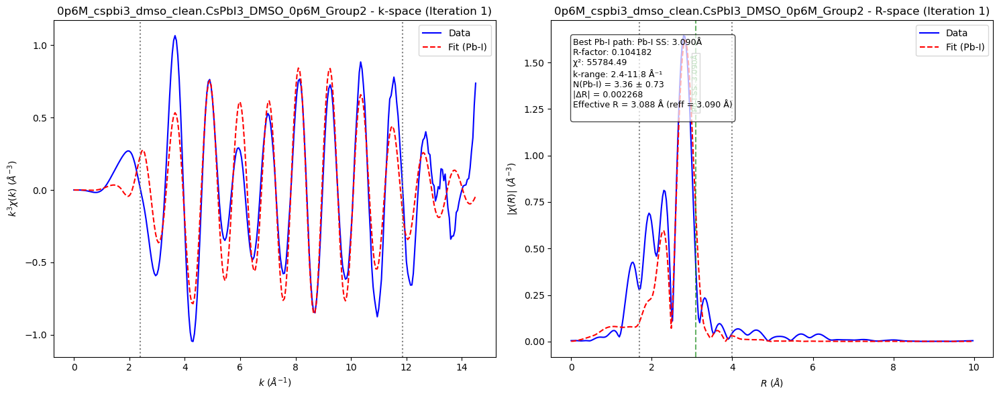


Processing Project: 0p7M_cspbi3_dmso_clean

Processing Group: 0p7M_cspbi3_dmso_clean.CsPbI3_DMSO_0p7M_Group1_clean

Processing group: 0p7M_cspbi3_dmso_clean.CsPbI3_DMSO_0p7M_Group1_clean
Creating Fourier Transform parameters for unknown...
  Found optimized kmin = 2.40 (from ft_processing_batch)
  Found optimized kmax = 11.75 (from ft_processing_batch)
  Using rbkg reference = 1.18 A
  Using fit rmin = 1.66 A (detected)
  Created transform with k-range: 2.40 to 11.75 Å⁻¹, kw=3
Evaluating 25 Pb-I paths for 0p7M_cspbi3_dmso_clean.CsPbI3_DMSO_0p7M_Group1_clean...
Building parameter group for iteration 1...
  Created parameters for iteration 1: <Param Group 0x248d0b07380>
  Path 1: Pb-I SS: 2.812Å - |ΔR|: 0.200, R-factor: 1.036647
Building parameter group for iteration 1...
  Created parameters for iteration 1: <Param Group 0x248d5d55430>
  Path 2: Pb-I SS: 2.843Å - |ΔR|: 0.200, R-factor: 1.117483
Building parameter group for iteration 1...
  Created parameters for iteration 1: <Param Gro

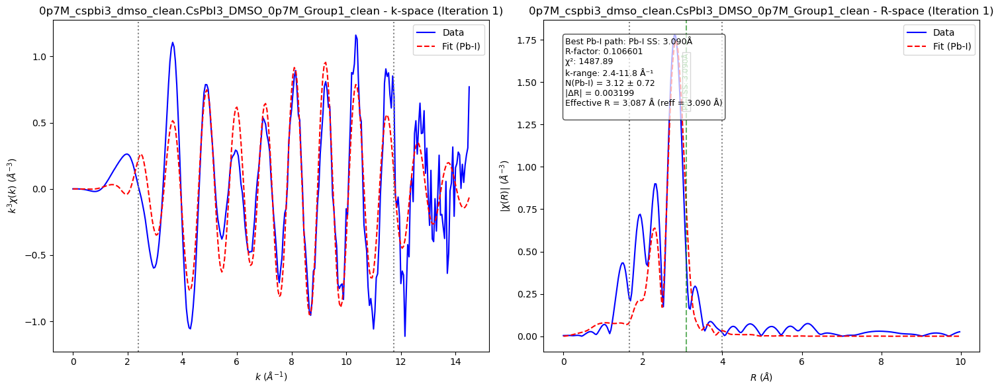


Processing Project: 0p8M_cspbi3_dmso_clean

Processing Group: 0p8M_cspbi3_dmso_clean.CsPbI3_DMSO_0p8M_Group1

Processing group: 0p8M_cspbi3_dmso_clean.CsPbI3_DMSO_0p8M_Group1
Creating Fourier Transform parameters for unknown...
  Found optimized kmin = 2.40 (from ft_processing_batch)
  Found optimized kmax = 11.75 (from ft_processing_batch)
  Using rbkg reference = 1.06 A
  Using fit rmin = 1.69 A (detected)
  Created transform with k-range: 2.40 to 11.75 Å⁻¹, kw=3
Evaluating 25 Pb-I paths for 0p8M_cspbi3_dmso_clean.CsPbI3_DMSO_0p8M_Group1...
Building parameter group for iteration 1...
  Created parameters for iteration 1: <Param Group 0x248d4bd2ab0>
  Path 1: Pb-I SS: 2.812Å - |ΔR|: 0.200, R-factor: 1.021759
Building parameter group for iteration 1...
  Created parameters for iteration 1: <Param Group 0x248d315bcb0>
  Path 2: Pb-I SS: 2.843Å - |ΔR|: 0.200, R-factor: 1.097562
Building parameter group for iteration 1...
  Created parameters for iteration 1: <Param Group 0x248d1f302c0>


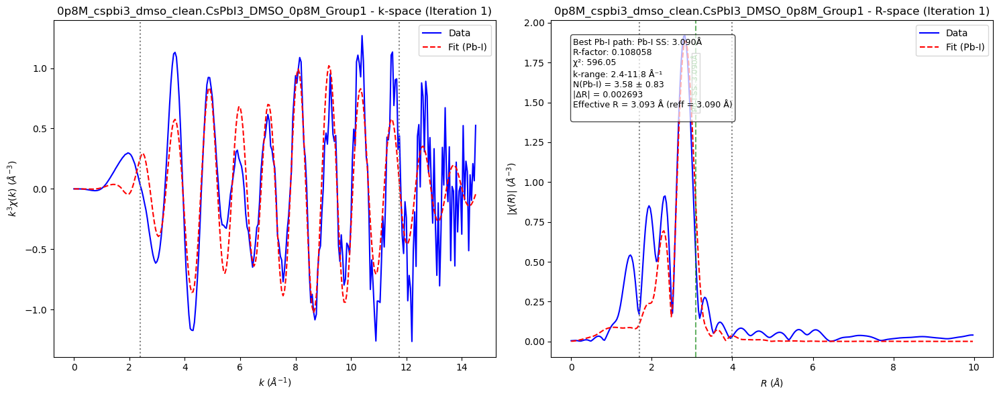


Processing Group: 0p8M_cspbi3_dmso_clean.CsPbI3_DMSO_0p8M_Group2

Processing group: 0p8M_cspbi3_dmso_clean.CsPbI3_DMSO_0p8M_Group2
Creating Fourier Transform parameters for unknown...
  Found optimized kmin = 2.40 (from ft_processing_batch)
  Found optimized kmax = 11.80 (from ft_processing_batch)
  Using rbkg reference = 1.06 A
  Using fit rmin = 1.69 A (detected)
  Created transform with k-range: 2.40 to 11.80 Å⁻¹, kw=3
Evaluating 25 Pb-I paths for 0p8M_cspbi3_dmso_clean.CsPbI3_DMSO_0p8M_Group2...
Building parameter group for iteration 1...
  Created parameters for iteration 1: <Param Group 0x248d1d86510>
  Path 1: Pb-I SS: 2.812Å - |ΔR|: 0.200, R-factor: 1.029014
Building parameter group for iteration 1...
  Created parameters for iteration 1: <Param Group 0x248d1f86750>
  Path 2: Pb-I SS: 2.843Å - |ΔR|: 0.200, R-factor: 1.105125
Building parameter group for iteration 1...
  Created parameters for iteration 1: <Param Group 0x248d1f86480>
  Path 3: Pb-I SS: 2.881Å - |ΔR|: 0.200, R-f

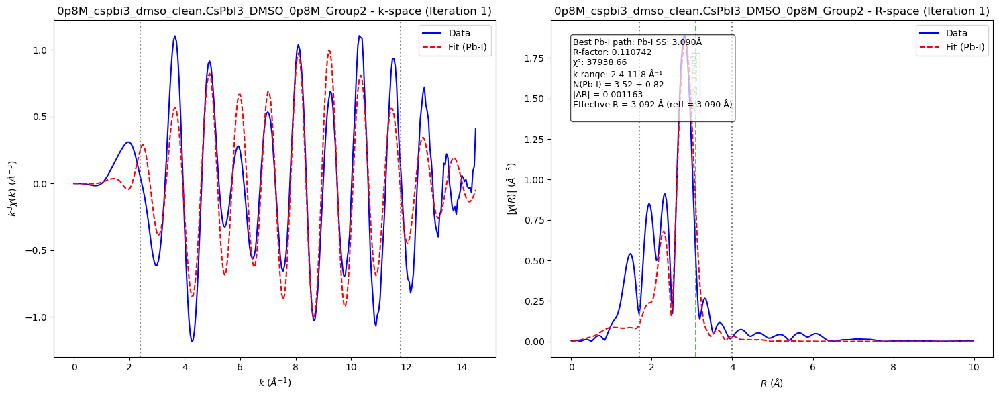


Processing Project: 0p9M_cspbi3_dmso_clean

Processing Group: 0p9M_cspbi3_dmso_clean.CsPbI3_DMSO_0p9M_Group1

Processing group: 0p9M_cspbi3_dmso_clean.CsPbI3_DMSO_0p9M_Group1
Creating Fourier Transform parameters for unknown...
  Found optimized kmin = 2.35 (from ft_processing_batch)
  Found optimized kmax = 11.80 (from ft_processing_batch)
  Using rbkg reference = 1.18 A
  Using fit rmin = 1.69 A (detected)
  Created transform with k-range: 2.35 to 11.80 Å⁻¹, kw=3
Evaluating 25 Pb-I paths for 0p9M_cspbi3_dmso_clean.CsPbI3_DMSO_0p9M_Group1...
Building parameter group for iteration 1...
  Created parameters for iteration 1: <Param Group 0x248d4bfe180>
  Path 1: Pb-I SS: 2.812Å - |ΔR|: 0.200, R-factor: 1.038876
Building parameter group for iteration 1...
  Created parameters for iteration 1: <Param Group 0x248d31da600>
  Path 2: Pb-I SS: 2.843Å - |ΔR|: 0.200, R-factor: 1.136965
Building parameter group for iteration 1...
  Created parameters for iteration 1: <Param Group 0x248d5ca5ee0>


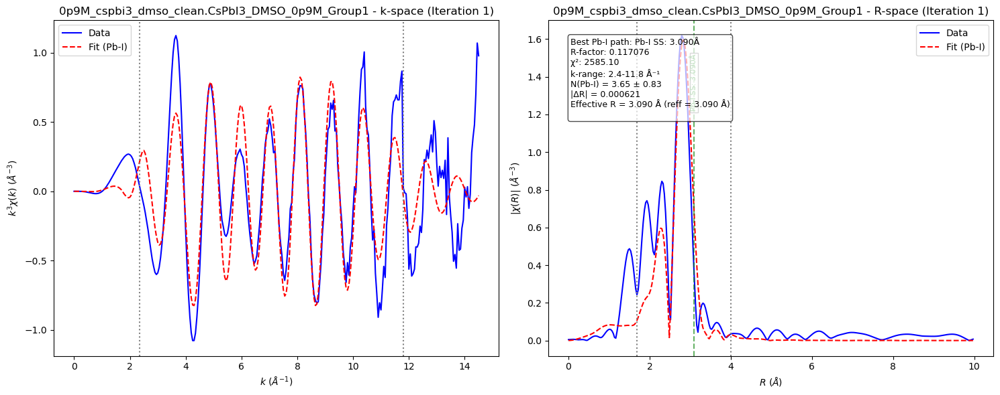


Processing Group: 0p9M_cspbi3_dmso_clean.CsPbI3_DMSO_0p9M_Group2

Processing group: 0p9M_cspbi3_dmso_clean.CsPbI3_DMSO_0p9M_Group2
Creating Fourier Transform parameters for unknown...
  Found optimized kmin = 2.35 (from ft_processing_batch)
  Found optimized kmax = 11.85 (from ft_processing_batch)
  Using rbkg reference = 1.18 A
  Using fit rmin = 1.69 A (detected)
  Created transform with k-range: 2.35 to 11.85 Å⁻¹, kw=3
Evaluating 25 Pb-I paths for 0p9M_cspbi3_dmso_clean.CsPbI3_DMSO_0p9M_Group2...
Building parameter group for iteration 1...
  Created parameters for iteration 1: <Param Group 0x248d5edaea0>
  Path 1: Pb-I SS: 2.812Å - |ΔR|: 0.200, R-factor: 1.042721
Building parameter group for iteration 1...
  Created parameters for iteration 1: <Param Group 0x248d4af8890>
  Path 2: Pb-I SS: 2.843Å - |ΔR|: 0.200, R-factor: 1.143098
Building parameter group for iteration 1...
  Created parameters for iteration 1: <Param Group 0x248d48cda60>
  Path 3: Pb-I SS: 2.881Å - |ΔR|: 0.200, R-f

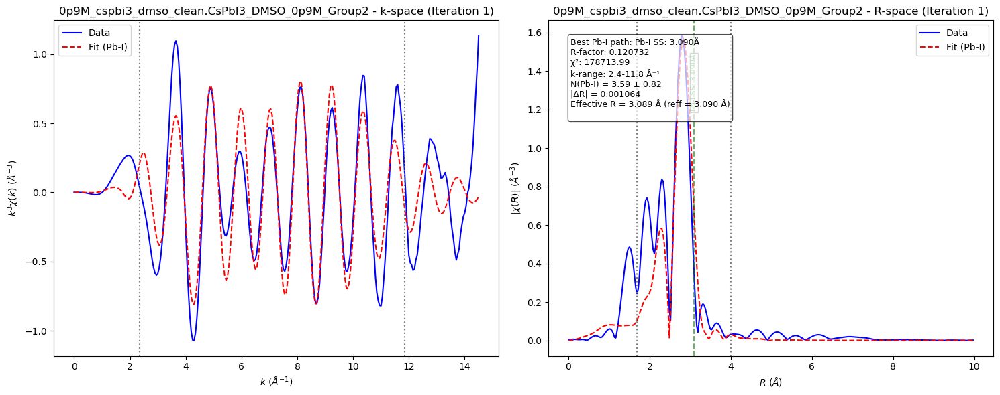


Processing Project: 1p0M_cspbi3_dmso_clean

Processing Group: 1p0M_cspbi3_dmso_clean.CsPbI3_DMSO_1p0M_Group1

Processing group: 1p0M_cspbi3_dmso_clean.CsPbI3_DMSO_1p0M_Group1
Creating Fourier Transform parameters for unknown...
  Found optimized kmin = 2.40 (from ft_processing_batch)
  Found optimized kmax = 11.85 (from ft_processing_batch)
  Using rbkg reference = 1.06 A
  Using fit rmin = 1.69 A (detected)
  Created transform with k-range: 2.40 to 11.85 Å⁻¹, kw=3
Evaluating 25 Pb-I paths for 1p0M_cspbi3_dmso_clean.CsPbI3_DMSO_1p0M_Group1...
Building parameter group for iteration 1...
  Created parameters for iteration 1: <Param Group 0x248d1f31460>
  Path 1: Pb-I SS: 2.812Å - |ΔR|: 0.200, R-factor: 1.041811
Building parameter group for iteration 1...
  Created parameters for iteration 1: <Param Group 0x248d1f05d30>
  Path 2: Pb-I SS: 2.843Å - |ΔR|: 0.200, R-factor: 1.135509
Building parameter group for iteration 1...
  Created parameters for iteration 1: <Param Group 0x248d1f05430>


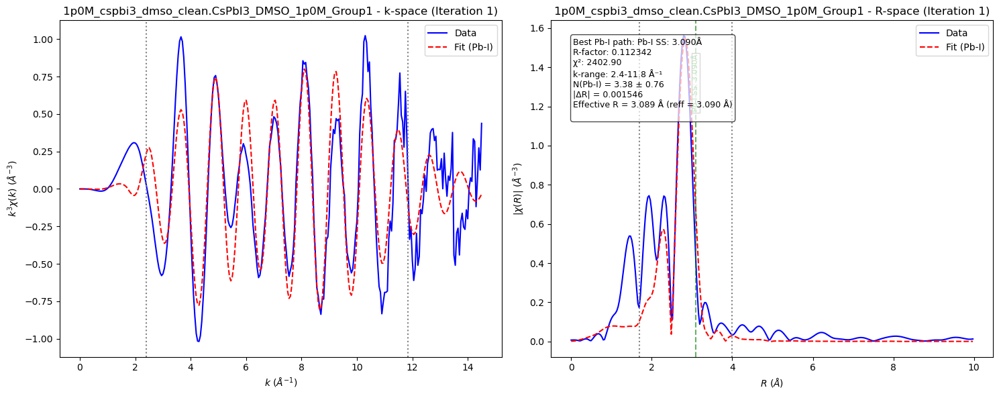


Processing Group: 1p0M_cspbi3_dmso_clean.CsPbI3_DMSO_1p0M_Group2

Processing group: 1p0M_cspbi3_dmso_clean.CsPbI3_DMSO_1p0M_Group2
Creating Fourier Transform parameters for unknown...
  Found optimized kmin = 2.40 (from ft_processing_batch)
  Found optimized kmax = 11.85 (from ft_processing_batch)
  Using rbkg reference = 1.06 A
  Using fit rmin = 1.69 A (detected)
  Created transform with k-range: 2.40 to 11.85 Å⁻¹, kw=3
Evaluating 25 Pb-I paths for 1p0M_cspbi3_dmso_clean.CsPbI3_DMSO_1p0M_Group2...
Building parameter group for iteration 1...
  Created parameters for iteration 1: <Param Group 0x248d49f46e0>
  Path 1: Pb-I SS: 2.812Å - |ΔR|: 0.200, R-factor: 1.051976
Building parameter group for iteration 1...
  Created parameters for iteration 1: <Param Group 0x248d4875100>
  Path 2: Pb-I SS: 2.843Å - |ΔR|: 0.200, R-factor: 0.344975
Building parameter group for iteration 1...
  Created parameters for iteration 1: <Param Group 0x248d0ab6c00>
  Path 3: Pb-I SS: 2.881Å - |ΔR|: 0.200, R-f

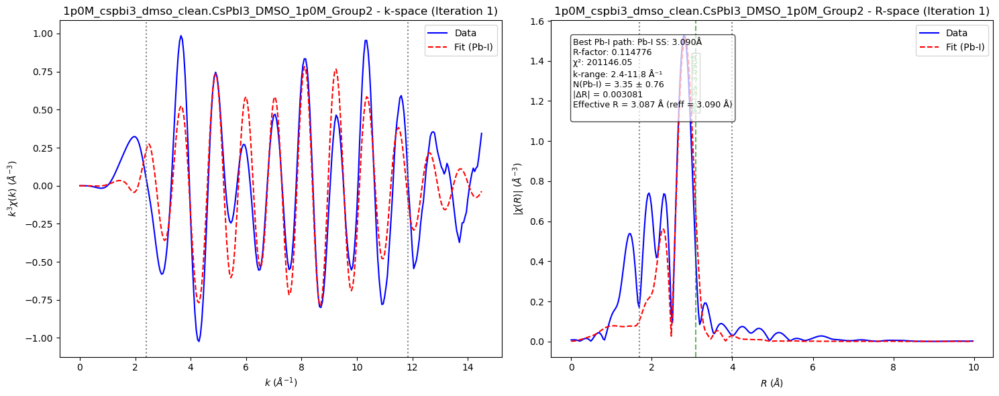


Processing Project: 1p2M_cspbi3_dmso_clean

Processing Group: 1p2M_cspbi3_dmso_clean.CsPbI3_DMSO_1p2M_Group1

Processing group: 1p2M_cspbi3_dmso_clean.CsPbI3_DMSO_1p2M_Group1
Creating Fourier Transform parameters for unknown...
  Found optimized kmin = 2.35 (from ft_processing_batch)
  Found optimized kmax = 11.95 (from ft_processing_batch)
  Using rbkg reference = 1.06 A
  Using fit rmin = 1.63 A (detected)
  Created transform with k-range: 2.35 to 11.95 Å⁻¹, kw=3
Evaluating 25 Pb-I paths for 1p2M_cspbi3_dmso_clean.CsPbI3_DMSO_1p2M_Group1...
Building parameter group for iteration 1...
  Created parameters for iteration 1: <Param Group 0x248d5dd6c90>
  Path 1: Pb-I SS: 2.812Å - |ΔR|: 0.200, R-factor: 1.056813
Building parameter group for iteration 1...
  Created parameters for iteration 1: <Param Group 0x248d32e3a40>
  Path 2: Pb-I SS: 2.843Å - |ΔR|: 0.200, R-factor: 0.546782
Building parameter group for iteration 1...
  Created parameters for iteration 1: <Param Group 0x248d5e52150>


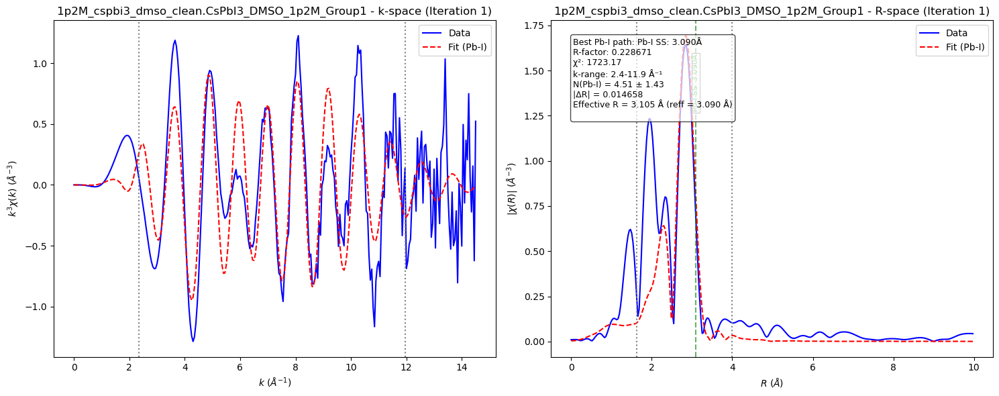


ITERATION 1 SUMMARY: BEST Pb-I PATHS FOR ALL GROUPS
Successfully processed 20 groups
----------------------------------------------------------------------------------------------------
Group                          Path                      Reff    |ΔR|    N(Pb-I) Eff. R  R-factor  
----------------------------------------------------------------------------------------------------
0p1M_cspbi3_dmso_clean.CsPbI3_DMSO_0p1M_Group1_clean_smooth Pb-I SS: 3.090Å           3.090 0.004 3.00 3.086 0.12814360
0p1M_cspbi3_dmso_clean.CsPbI3_DMSO_0p1M_Group2_clean_1 Pb-I SS: 3.000Å           3.000 0.075 3.17 3.075 0.08432483
0p1M_cspbi3_dmso_clean.CsPbI3_DMSO_0p1m_Group3_clean_deconv Pb-I SS: 3.090Å           3.090 0.002 3.49 3.089 0.11423967
0p2M_cspbi3_dmso_clean.CsPbI3_DMSO_0p2M_Group1_clean Pb-I SS: 3.090Å           3.090 0.004 3.43 3.094 0.11058457
0p2M_cspbi3_dmso_clean.CsPbI3_DMSO_0p2M_Group2 Pb-I SS: 3.090Å           3.090 0.001 3.38 3.092 0.11176468
0p3M_cspbi3_dmso_clean.CsPbI3_DMSO_0p

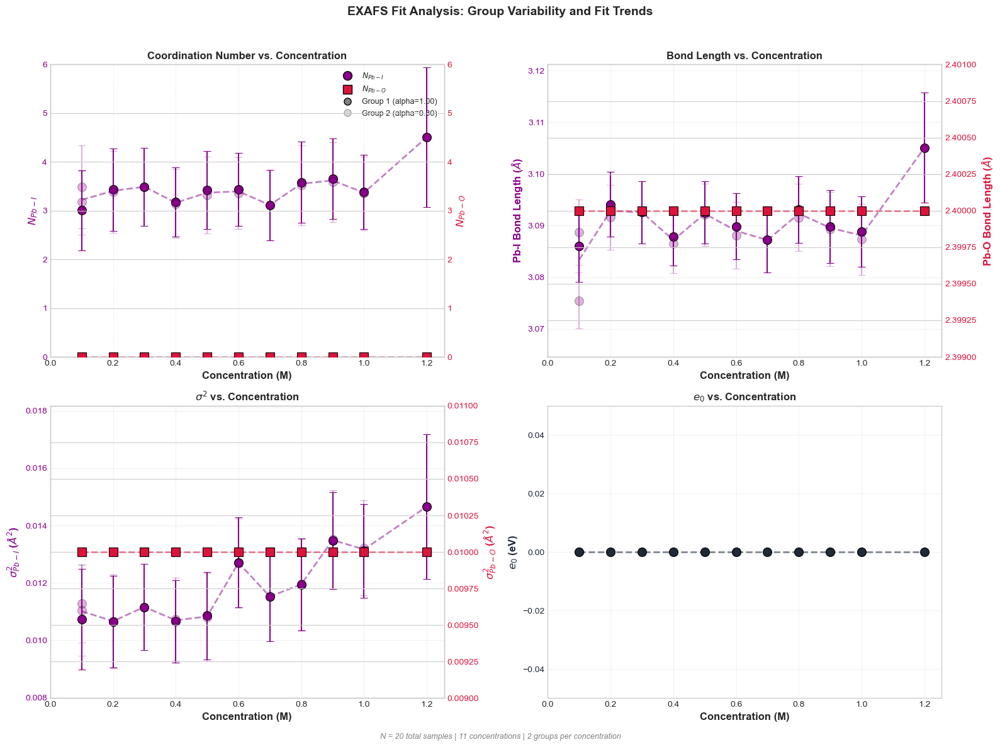


PLOT_FIT_2X2_SUMMARY
  Total groups:      20
  Concentrations:    11
  Figure saved:      Not saved
--------------------------------------------------------------------------------
  Per-concentration summary:
    Conc 0.100 M: 3 groups, avg N_I=3.22, avg N_O=0.00, avg sigma2_I=0.01102, avg sigma2_O=0.01000, avg e0=0.000
    Conc 0.200 M: 2 groups, avg N_I=3.41, avg N_O=0.00, avg sigma2_I=0.01066, avg sigma2_O=0.01000, avg e0=0.000
    Conc 0.300 M: 1 groups, avg N_I=3.49, avg N_O=0.00, avg sigma2_I=0.01116, avg sigma2_O=0.01000, avg e0=0.000
    Conc 0.400 M: 2 groups, avg N_I=3.16, avg N_O=0.00, avg sigma2_I=0.01070, avg sigma2_O=0.01000, avg e0=0.000
    Conc 0.500 M: 2 groups, avg N_I=3.37, avg N_O=0.00, avg sigma2_I=0.01083, avg sigma2_O=0.01000, avg e0=0.000
    Conc 0.600 M: 2 groups, avg N_I=3.40, avg N_O=0.00, avg sigma2_I=0.01270, avg sigma2_O=0.01000, avg e0=0.000
    Conc 0.700 M: 1 groups, avg N_I=3.12, avg N_O=0.00, avg sigma2_I=0.01153, avg sigma2_O=0.01000, avg e0=0.00

In [3]:
# 1. Add Pb-I
cspbi3_fit.enhanced_iteration1_fit(feff_dir, e0=0, vary_e0=False)
fig, axes = cspbi3_fit.plot_fit_2x2_summary(
    figsize=(16, 12),
    dpi=300,
    save_path=None,
    n_groups=2,
)



AICc improvement threshold for Pb-O: 0.000
Pb-O AIMD single-shell enabled: mode=restrain, sigma2 target=0.055225 A^2, restraint strength=0.1
Searching for candidate 'Pb-O' paths in C:\Users\kwill\.larch\feff...
Found 1959 candidate paths for category 'Pb-O'.
    1: Pb-O SS: 2.233Å, reff = 2.233 Å
    2: Pb-O SS: 2.237Å, reff = 2.237 Å
    3: Pb-O SS: 2.241Å, reff = 2.241 Å
    4: Pb-O SS: 2.248Å, reff = 2.248 Å
    5: Pb-O SS: 2.288Å, reff = 2.288 Å
      ... (1954 more paths)

Pb-O SPLIT TWO-SHELL MODEL
  sigma^2 fixed at 0.0250 A^2 (AIMD-informed)
  split_O constrained to [0.30, 0.38] A (target 0.34 A)
  N_O1, N_O2 in [0, 6]; N_total checked against 8
  AICc gate: ΔAICc <= 0.000
  No third cumulant.
  Path selection: Selected pair Reff_O1=2.434 A, Reff_O2=2.774 A, separation=0.340 A (target=0.34 A).

Processing project (split): 0p1M_cspbi3_dmso_clean

  Group: 0p1M_cspbi3_dmso_clean.CsPbI3_DMSO_0p1M_Group2_clean_1
Creating Fourier Transform parameters for unknown...
  Found optimized

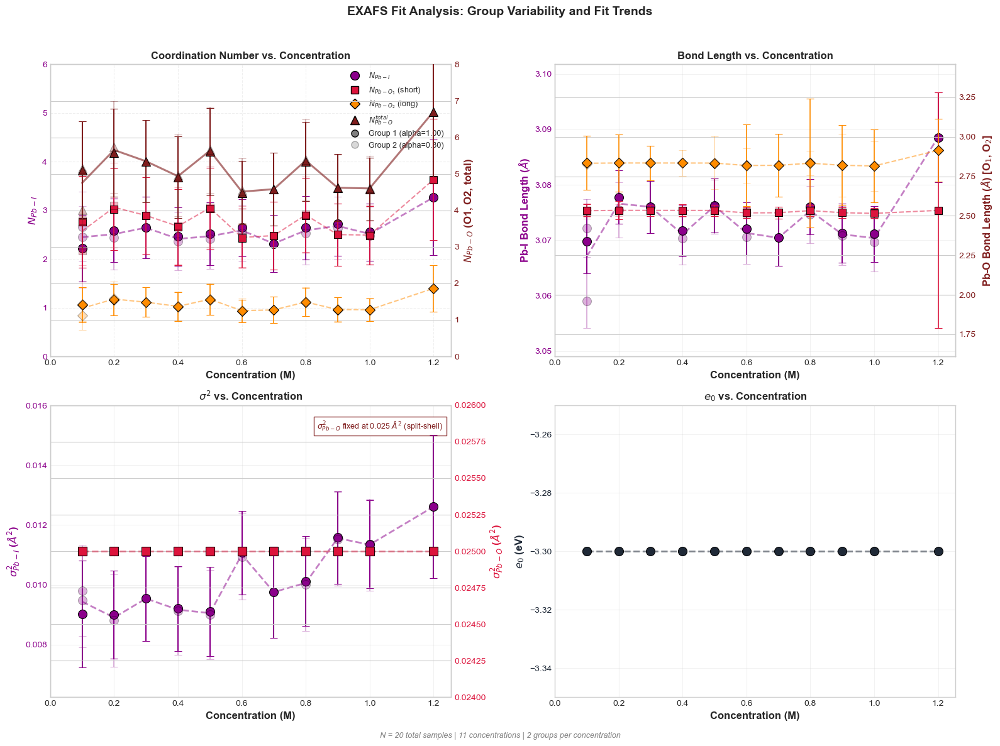


PLOT_FIT_2X2_SUMMARY
  Total groups:      20
  Concentrations:    11
  Figure saved:      Not saved
--------------------------------------------------------------------------------
  Per-concentration summary:
    Conc 0.100 M: 3 groups, avg N_I=2.45, avg N_Pb-O1=3.43, avg N_Pb-O2=1.32, avg N_Pb-O(total)=4.75, avg sigma2_I=0.00944, sigma2_Pb-O=0.02500 (FIXED), avg e0=-3.300
    Conc 0.200 M: 2 groups, avg N_I=2.51, avg N_Pb-O1=4.08, avg N_Pb-O2=1.57, avg N_Pb-O(total)=5.65, avg sigma2_I=0.00890, sigma2_Pb-O=0.02500 (FIXED), avg e0=-3.300
    Conc 0.300 M: 1 groups, avg N_I=2.64, avg N_Pb-O1=3.86, avg N_Pb-O2=1.48, avg N_Pb-O(total)=5.35, avg sigma2_I=0.00954, sigma2_Pb-O=0.02500 (FIXED), avg e0=-3.300
    Conc 0.400 M: 2 groups, avg N_I=2.41, avg N_Pb-O1=3.57, avg N_Pb-O2=1.37, avg N_Pb-O(total)=4.94, avg sigma2_I=0.00917, sigma2_Pb-O=0.02500 (FIXED), avg e0=-3.300
    Conc 0.500 M: 2 groups, avg N_I=2.47, avg N_Pb-O1=4.07, avg N_Pb-O2=1.57, avg N_Pb-O(total)=5.64, avg sigma2_I=0.0090

In [4]:

# 2. Add Pb-O
cspbi3_fit.iterative_fit_all(
    'Pb-O',
    iteration=2,
    feff_base_dir=feff_dir,
    physical_sanity_mode='off',
    use_pb_o_aimd_single_shell=True,
    pb_o_sigma2_mode='restrain',
    pb_o_sigma2_restraint_strength=0.1,
    pb_o_aicc_improvement_threshold=0,
    pb_o_model='split_two_shell'
    
)
fig, axes = cspbi3_fit.plot_fit_2x2_summary(
    figsize=(16, 12),
    dpi=300,
    save_path=None,
    n_groups=2,
)



PATH REPLACEMENT FIT - Iteration 2
ΔR threshold = 0.060 Å
Candidate FEFF paths scanned: 4432
Sanity scope: off
Vary e0: True (default fixed e0 = -3.300 eV)
Require valid AICc: False
Allow R-factor fallback: True
Reject on bound pinning: False
Targeted path roles: ['SS_I']

Group: 0p1M_cspbi3_dmso_clean.CsPbI3_DMSO_0p1M_Group2_clean_1
  Starting R-factor: 0.065471

Group: 0p1M_cspbi3_dmso_clean.CsPbI3_DMSO_0p1M_Group1_clean_smooth
  Starting R-factor: 0.084261

Group: 0p1M_cspbi3_dmso_clean.CsPbI3_DMSO_0p1m_Group3_clean_deconv
  Starting R-factor: 0.073104

Group: 0p2M_cspbi3_dmso_clean.CsPbI3_DMSO_0p2M_Group1_clean
  Starting R-factor: 0.060928

Group: 0p2M_cspbi3_dmso_clean.CsPbI3_DMSO_0p2M_Group2
  Starting R-factor: 0.067049

Group: 0p3M_cspbi3_dmso_clean.CsPbI3_DMSO_0p3M_Group1
  Starting R-factor: 0.056826

Group: 0p4M_cspbi3_dmso_clean.CsPbI3_DMSO_0p4M_Group1
  Starting R-factor: 0.056635

Group: 0p4M_cspbi3_dmso_clean.CsPbI3_DMSO_0p4M_Group2
  Starting R-factor: 0.060234

Group

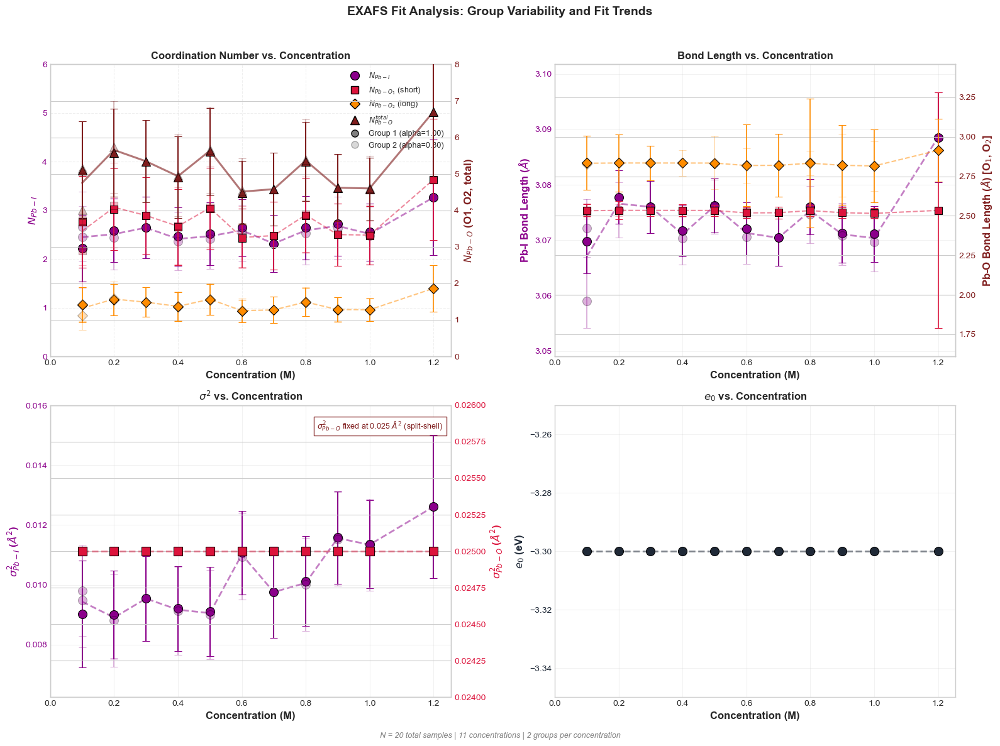


PLOT_FIT_2X2_SUMMARY
  Total groups:      20
  Concentrations:    11
  Figure saved:      Not saved
--------------------------------------------------------------------------------
  Per-concentration summary:
    Conc 0.100 M: 3 groups, avg N_I=2.45, avg N_Pb-O1=3.43, avg N_Pb-O2=1.32, avg N_Pb-O(total)=4.75, avg sigma2_I=0.00944, sigma2_Pb-O=0.02500 (FIXED), avg e0=-3.300
    Conc 0.200 M: 2 groups, avg N_I=2.51, avg N_Pb-O1=4.08, avg N_Pb-O2=1.57, avg N_Pb-O(total)=5.65, avg sigma2_I=0.00890, sigma2_Pb-O=0.02500 (FIXED), avg e0=-3.300
    Conc 0.300 M: 1 groups, avg N_I=2.64, avg N_Pb-O1=3.86, avg N_Pb-O2=1.48, avg N_Pb-O(total)=5.35, avg sigma2_I=0.00954, sigma2_Pb-O=0.02500 (FIXED), avg e0=-3.300
    Conc 0.400 M: 2 groups, avg N_I=2.41, avg N_Pb-O1=3.57, avg N_Pb-O2=1.37, avg N_Pb-O(total)=4.94, avg sigma2_I=0.00917, sigma2_Pb-O=0.02500 (FIXED), avg e0=-3.300
    Conc 0.500 M: 2 groups, avg N_I=2.47, avg N_Pb-O1=4.07, avg N_Pb-O2=1.57, avg N_Pb-O(total)=5.64, avg sigma2_I=0.0090

In [5]:

# 3. Replace Pb-I
cspbi3_fit.replace_large_delr_paths(
    iteration=2,
    feff_base_dir=feff_dir,
    delr_threshold=0.06,
    improvement_tolerance=0.0005,
    target_param_types=['SS_I'],
    strict_scatterers=False,
    max_candidates_per_path=20,
    max_total_replacements_per_group=1,
    require_delr_improvement=True,
    sanity_scope='off',
    require_valid_aicc=False,
    allow_rfactor_fallback=True,
    reject_on_bound_pinning=False,
    verbose=True,
    plot_results=False,
    vary_e0 = True
)
fig, axes = cspbi3_fit.plot_fit_2x2_summary(
    figsize=(16, 12),
    dpi=300,
    save_path=None,
    n_groups=2,
)



PATH REPLACEMENT FIT - Iteration 2
ΔR threshold = 0.060 Å
Candidate FEFF paths scanned: 4432
Sanity scope: off
Vary e0: True (default fixed e0 = -3.300 eV)
Require valid AICc: False
Allow R-factor fallback: True
Reject on bound pinning: False
Targeted path roles: ['SS_O']

Group: 0p1M_cspbi3_dmso_clean.CsPbI3_DMSO_0p1M_Group2_clean_1
  Starting R-factor: 0.065471

Group: 0p1M_cspbi3_dmso_clean.CsPbI3_DMSO_0p1M_Group1_clean_smooth
  Starting R-factor: 0.084261

Group: 0p1M_cspbi3_dmso_clean.CsPbI3_DMSO_0p1m_Group3_clean_deconv
  Starting R-factor: 0.073104

Group: 0p2M_cspbi3_dmso_clean.CsPbI3_DMSO_0p2M_Group1_clean
  Starting R-factor: 0.060928

Group: 0p2M_cspbi3_dmso_clean.CsPbI3_DMSO_0p2M_Group2
  Starting R-factor: 0.067049

Group: 0p3M_cspbi3_dmso_clean.CsPbI3_DMSO_0p3M_Group1
  Starting R-factor: 0.056826

Group: 0p4M_cspbi3_dmso_clean.CsPbI3_DMSO_0p4M_Group1
  Starting R-factor: 0.056635

Group: 0p4M_cspbi3_dmso_clean.CsPbI3_DMSO_0p4M_Group2
  Starting R-factor: 0.060234

Group

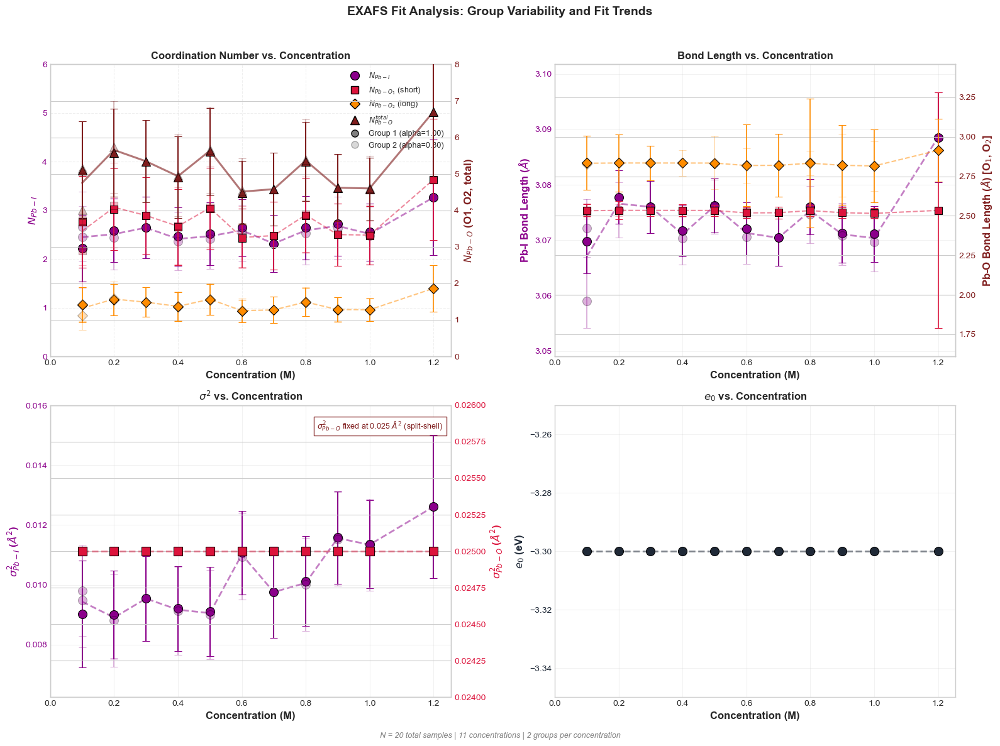


PLOT_FIT_2X2_SUMMARY
  Total groups:      20
  Concentrations:    11
  Figure saved:      Not saved
--------------------------------------------------------------------------------
  Per-concentration summary:
    Conc 0.100 M: 3 groups, avg N_I=2.45, avg N_Pb-O1=3.43, avg N_Pb-O2=1.32, avg N_Pb-O(total)=4.75, avg sigma2_I=0.00944, sigma2_Pb-O=0.02500 (FIXED), avg e0=-3.300
    Conc 0.200 M: 2 groups, avg N_I=2.51, avg N_Pb-O1=4.08, avg N_Pb-O2=1.57, avg N_Pb-O(total)=5.65, avg sigma2_I=0.00890, sigma2_Pb-O=0.02500 (FIXED), avg e0=-3.300
    Conc 0.300 M: 1 groups, avg N_I=2.64, avg N_Pb-O1=3.86, avg N_Pb-O2=1.48, avg N_Pb-O(total)=5.35, avg sigma2_I=0.00954, sigma2_Pb-O=0.02500 (FIXED), avg e0=-3.300
    Conc 0.400 M: 2 groups, avg N_I=2.41, avg N_Pb-O1=3.57, avg N_Pb-O2=1.37, avg N_Pb-O(total)=4.94, avg sigma2_I=0.00917, sigma2_Pb-O=0.02500 (FIXED), avg e0=-3.300
    Conc 0.500 M: 2 groups, avg N_I=2.47, avg N_Pb-O1=4.07, avg N_Pb-O2=1.57, avg N_Pb-O(total)=5.64, avg sigma2_I=0.0090

In [6]:

cspbi3_fit.replace_large_delr_paths(
    iteration=2,
    feff_base_dir=feff_dir,
    delr_threshold=0.06,
    improvement_tolerance=0.0005,
    target_param_types=['SS_O'],
    strict_scatterers=False,
    max_candidates_per_path=20,
    max_total_replacements_per_group=1,
    require_delr_improvement=True,
    sanity_scope='off',
    require_valid_aicc=False,
    allow_rfactor_fallback=True,
    reject_on_bound_pinning=False,
    verbose=True,
    plot_results=False,
    vary_e0 = True
)
fig, axes = cspbi3_fit.plot_fit_2x2_summary(
    figsize=(16, 12),
    dpi=300,
    save_path=None,
    n_groups=2,
)


ITERATIVE FIT WITH LINKED PARAMETERS - Iteration 3
Adding Pb-S paths
Sanity mode: off
Require valid AICc: False
Allow R-factor fallback: True
Force add path(s): False (min=0)
Reject bound pinning: False
Vary e0: True (default fixed e0 = -3.300 eV)

Scanning C:\Users\kwill\.larch\feff for Pb-S paths...
  Found 285 candidate paths

Project: 0p1M_cspbi3_dmso_clean

  Group: 0p1M_cspbi3_dmso_clean.CsPbI3_DMSO_0p1M_Group2_clean_1
    Previous R-factor: 0.065471, paths: 3
Creating Fourier Transform parameters for unknown...
  Found optimized kmin = 2.45 (from ft_processing_batch)
  Found optimized kmax = 11.95 (from ft_processing_batch)
  Using rbkg reference = 1.18 A
  Using fit rmin = 1.69 A (detected)
  Created transform with k-range: 2.45 to 11.95 Å⁻¹, kw=3
    Current model AICc: -0.47 (Nind=16.4, k=6, RSS=4.4522)

Building linked parameter group for iteration 3
  Elements included: ['I', 'O', 'S']
  Updating from previous fit result
    s02 = 0.7800 (from amp)
    e0 = -3.3000 (from d

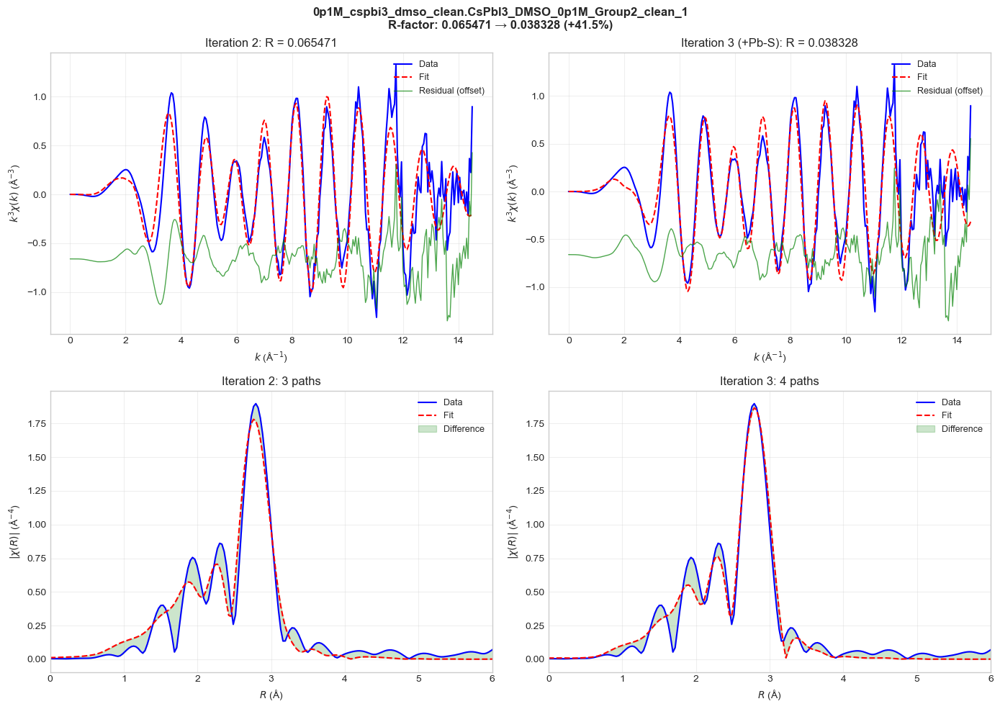


  Group: 0p1M_cspbi3_dmso_clean.CsPbI3_DMSO_0p1M_Group1_clean_smooth
    Previous R-factor: 0.084261, paths: 3
Creating Fourier Transform parameters for unknown...
  Found optimized kmin = 2.45 (from ft_processing_batch)
  Found optimized kmax = 11.85 (from ft_processing_batch)
  Using rbkg reference = 1.06 A
  Using fit rmin = 1.72 A (detected)
  Created transform with k-range: 2.45 to 11.85 Å⁻¹, kw=3
    Current model AICc: 11.21 (Nind=16.0, k=6, RSS=8.5669)

Building linked parameter group for iteration 3
  Elements included: ['I', 'O', 'S']
  Updating from previous fit result
    s02 = 0.7800 (from amp)
    e0 = -3.3000 (from del_e0)
    N_I = 2.2262 (from n_PbI)
    sigma2_I = 0.0090 (from pbi_sig2)
    delr_I = -0.0206 (from pbi_delr)
  Parameter summary:
    s02 = 0.780 (vary=False)
    e0  = -3.300 (vary=True)
    N_I       = 2.226
    sigma2_I  = 0.0090
    delr_I    = -0.0206
    [Pb-O split-shell model]
    N_O1      = 3.686
    N_O2      = 1.418
    N_O_total = 5.103
    s

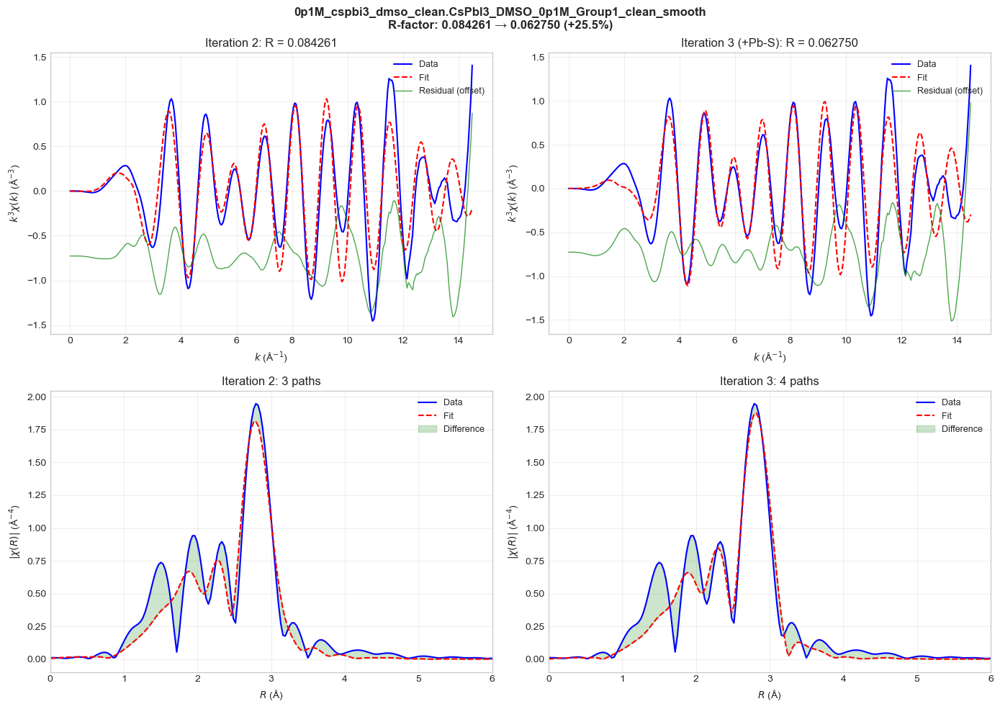


  Group: 0p1M_cspbi3_dmso_clean.CsPbI3_DMSO_0p1m_Group3_clean_deconv
    Previous R-factor: 0.073104, paths: 3
Creating Fourier Transform parameters for unknown...
  Found optimized kmin = 2.35 (from ft_processing_batch)
  Found optimized kmax = 11.95 (from ft_processing_batch)
  Using rbkg reference = 1.06 A
  Using fit rmin = 1.69 A (detected)
  Created transform with k-range: 2.35 to 11.95 Å⁻¹, kw=3
    Current model AICc: 8.48 (Nind=16.6, k=6, RSS=7.8995)

Building linked parameter group for iteration 3
  Elements included: ['I', 'O', 'S']
  Updating from previous fit result
    s02 = 0.7800 (from amp)
    e0 = -3.3000 (from del_e0)
    N_I = 2.6672 (from n_PbI)
    sigma2_I = 0.0095 (from pbi_sig2)
    delr_I = -0.0182 (from pbi_delr)
  Parameter summary:
    s02 = 0.780 (vary=False)
    e0  = -3.300 (vary=True)
    N_I       = 2.667
    sigma2_I  = 0.0095
    delr_I    = -0.0182
    [Pb-O split-shell model]
    N_O1      = 3.717
    N_O2      = 1.430
    N_O_total = 5.147
    si

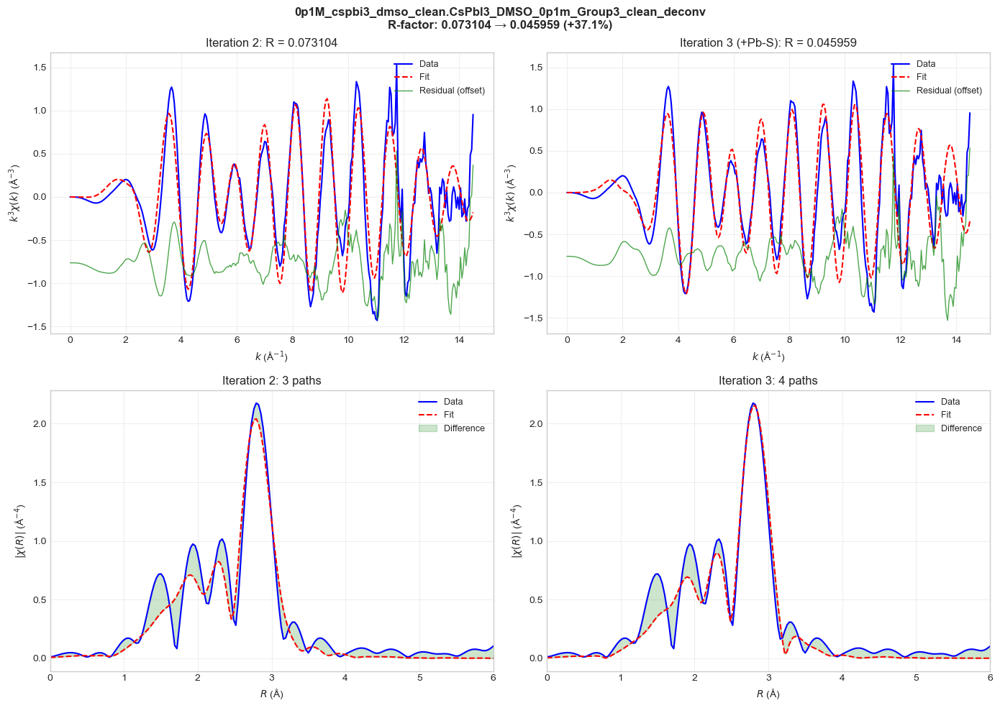


Project: 0p2M_cspbi3_dmso_clean

  Group: 0p2M_cspbi3_dmso_clean.CsPbI3_DMSO_0p2M_Group1_clean
    Previous R-factor: 0.060928, paths: 3
Creating Fourier Transform parameters for unknown...
  Found optimized kmin = 2.40 (from ft_processing_batch)
  Found optimized kmax = 11.75 (from ft_processing_batch)
  Using rbkg reference = 1.06 A
  Using fit rmin = 1.66 A (detected)
  Created transform with k-range: 2.40 to 11.75 Å⁻¹, kw=3
    Current model AICc: 7.96 (Nind=16.3, k=6, RSS=7.3448)

Building linked parameter group for iteration 3
  Elements included: ['I', 'O', 'S']
  Updating from previous fit result
    s02 = 0.7800 (from amp)
    e0 = -3.3000 (from del_e0)
    N_I = 2.5851 (from n_PbI)
    sigma2_I = 0.0090 (from pbi_sig2)
    delr_I = -0.0126 (from pbi_delr)
  Parameter summary:
    s02 = 0.780 (vary=False)
    e0  = -3.300 (vary=True)
    N_I       = 2.585
    sigma2_I  = 0.0090
    delr_I    = -0.0126
    [Pb-O split-shell model]
    N_O1      = 4.026
    N_O2      = 1.548
  

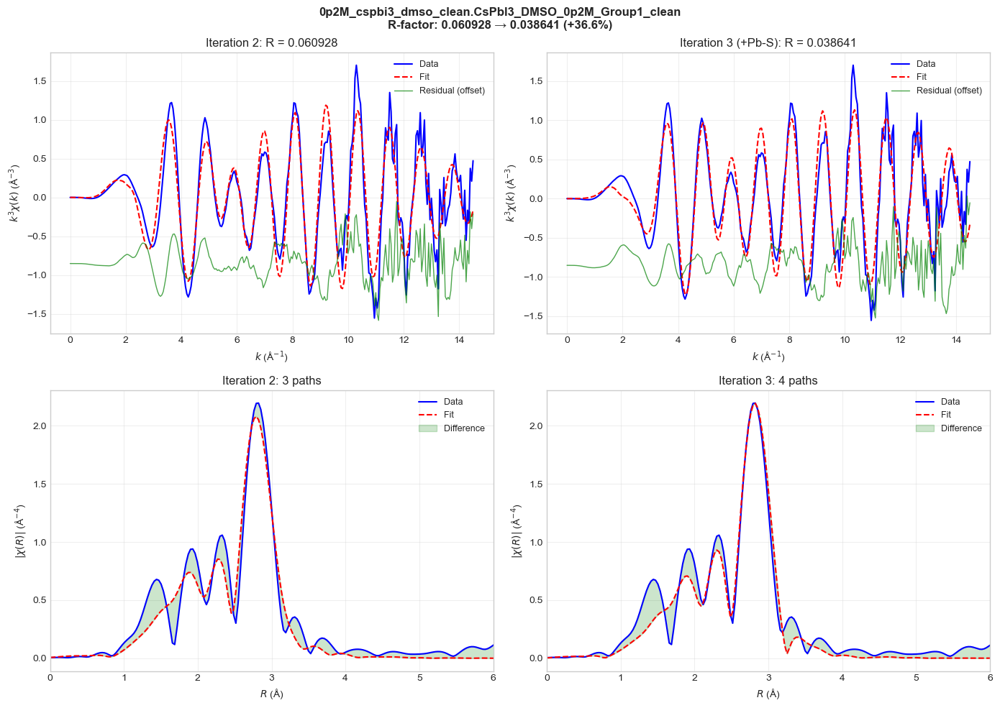


  Group: 0p2M_cspbi3_dmso_clean.CsPbI3_DMSO_0p2M_Group2
    Previous R-factor: 0.067049, paths: 3
Creating Fourier Transform parameters for unknown...
  Found optimized kmin = 2.45 (from ft_processing_batch)
  Found optimized kmax = 11.80 (from ft_processing_batch)
  Using rbkg reference = 1.06 A
  Using fit rmin = 1.66 A (detected)
  Created transform with k-range: 2.45 to 11.80 Å⁻¹, kw=3
    Current model AICc: 8.16 (Nind=16.3, k=6, RSS=7.4351)

Building linked parameter group for iteration 3
  Elements included: ['I', 'O', 'S']
  Updating from previous fit result
    s02 = 0.7800 (from amp)
    e0 = -3.3000 (from del_e0)
    N_I = 2.4410 (from n_PbI)
    sigma2_I = 0.0088 (from pbi_sig2)
    delr_I = -0.0149 (from pbi_delr)
  Parameter summary:
    s02 = 0.780 (vary=False)
    e0  = -3.300 (vary=True)
    N_I       = 2.441
    sigma2_I  = 0.0088
    delr_I    = -0.0149
    [Pb-O split-shell model]
    N_O1      = 4.142
    N_O2      = 1.593
    N_O_total = 5.735
    sigma2_O  = 0.0

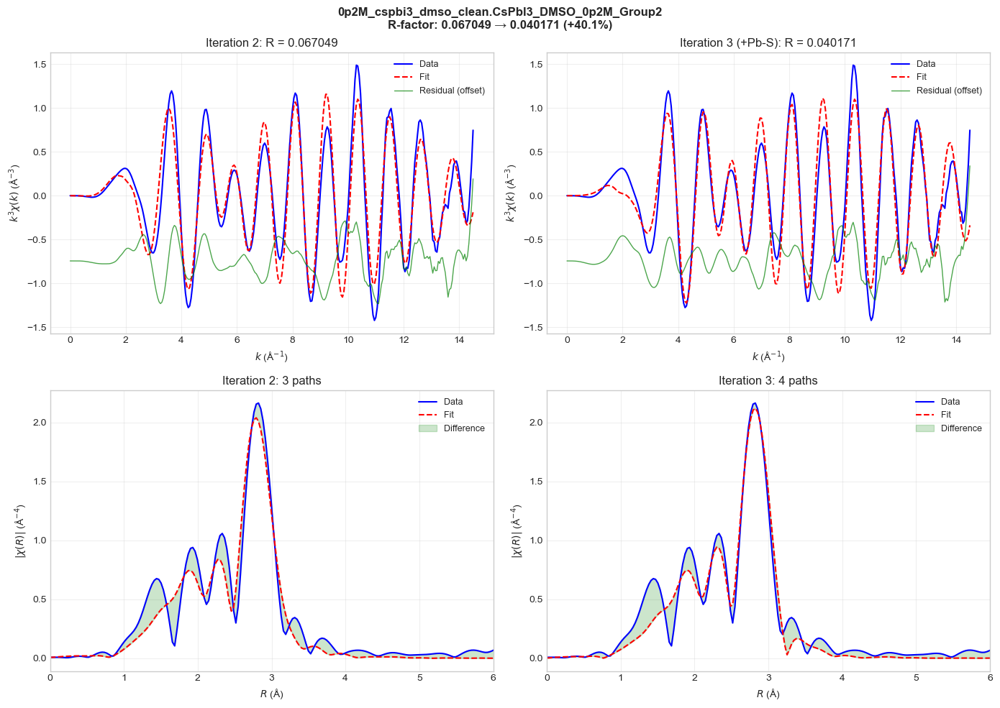


Project: 0p3M_cspbi3_dmso_clean

  Group: 0p3M_cspbi3_dmso_clean.CsPbI3_DMSO_0p3M_Group1
    Previous R-factor: 0.056826, paths: 3
Creating Fourier Transform parameters for unknown...
  Found optimized kmin = 2.40 (from ft_processing_batch)
  Found optimized kmax = 11.85 (from ft_processing_batch)
  Using rbkg reference = 1.06 A
  Using fit rmin = 1.69 A (detected)
  Created transform with k-range: 2.40 to 11.85 Å⁻¹, kw=3
    Current model AICc: 3.41 (Nind=16.3, k=6, RSS=5.5502)

Building linked parameter group for iteration 3
  Elements included: ['I', 'O', 'S']
  Updating from previous fit result
    s02 = 0.7800 (from amp)
    e0 = -3.3000 (from del_e0)
    N_I = 2.6440 (from n_PbI)
    sigma2_I = 0.0095 (from pbi_sig2)
    delr_I = -0.0144 (from pbi_delr)
  Parameter summary:
    s02 = 0.780 (vary=False)
    e0  = -3.300 (vary=True)
    N_I       = 2.644
    sigma2_I  = 0.0095
    delr_I    = -0.0144
    [Pb-O split-shell model]
    N_O1      = 3.861
    N_O2      = 1.485
    N_O_

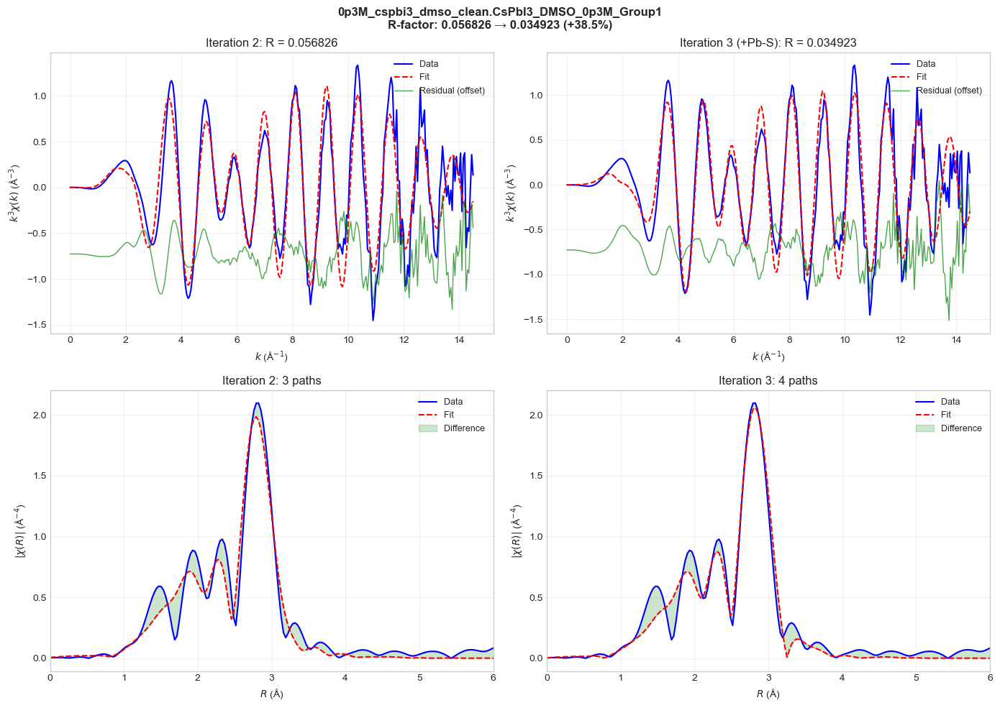


Project: 0p4M_cspbi3_dmso_clean

  Group: 0p4M_cspbi3_dmso_clean.CsPbI3_DMSO_0p4M_Group1
    Previous R-factor: 0.056635, paths: 3
Creating Fourier Transform parameters for unknown...
  Found optimized kmin = 2.45 (from ft_processing_batch)
  Found optimized kmax = 11.80 (from ft_processing_batch)
  Using rbkg reference = 1.06 A
  Using fit rmin = 1.69 A (detected)
  Created transform with k-range: 2.45 to 11.80 Å⁻¹, kw=3
    Current model AICc: 3.00 (Nind=16.1, k=6, RSS=5.2373)

Building linked parameter group for iteration 3
  Elements included: ['I', 'O', 'S']
  Updating from previous fit result
    s02 = 0.7800 (from amp)
    e0 = -3.3000 (from del_e0)
    N_I = 2.4613 (from n_PbI)
    sigma2_I = 0.0092 (from pbi_sig2)
    delr_I = -0.0187 (from pbi_delr)
  Parameter summary:
    s02 = 0.780 (vary=False)
    e0  = -3.300 (vary=True)
    N_I       = 2.461
    sigma2_I  = 0.0092
    delr_I    = -0.0187
    [Pb-O split-shell model]
    N_O1      = 3.546
    N_O2      = 1.364
    N_O_

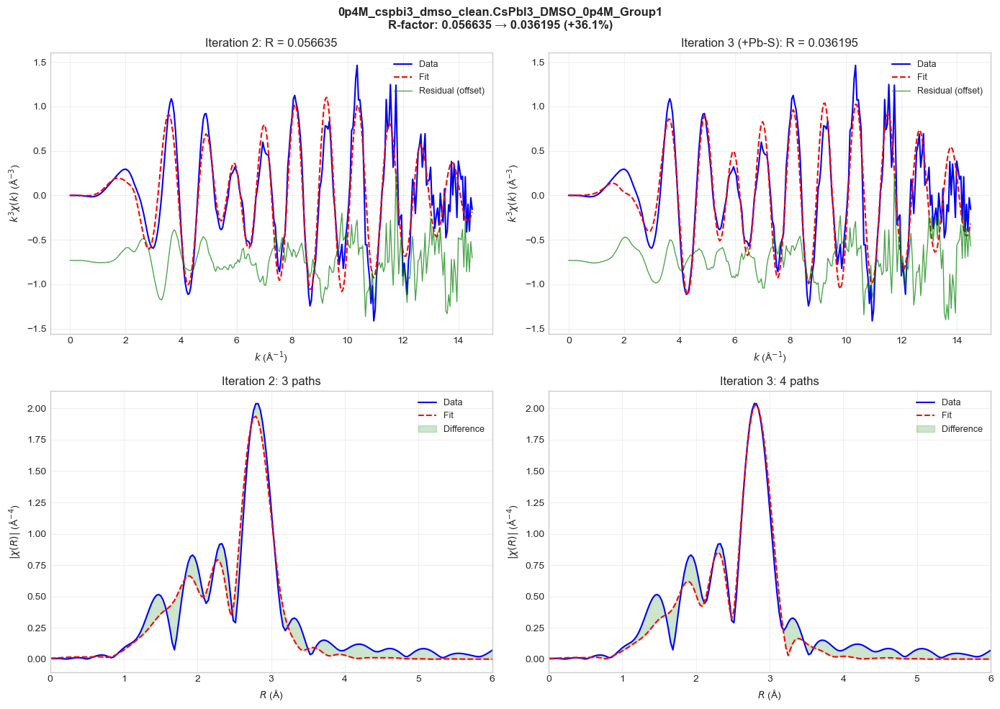


  Group: 0p4M_cspbi3_dmso_clean.CsPbI3_DMSO_0p4M_Group2
    Previous R-factor: 0.060234, paths: 3
Creating Fourier Transform parameters for unknown...
  Found optimized kmin = 2.45 (from ft_processing_batch)
  Found optimized kmax = 11.85 (from ft_processing_batch)
  Using rbkg reference = 1.06 A
  Using fit rmin = 1.69 A (detected)
  Created transform with k-range: 2.45 to 11.85 Å⁻¹, kw=3
    Current model AICc: 2.51 (Nind=16.2, k=6, RSS=5.1639)

Building linked parameter group for iteration 3
  Elements included: ['I', 'O', 'S']
  Updating from previous fit result
    s02 = 0.7800 (from amp)
    e0 = -3.3000 (from del_e0)
    N_I = 2.3684 (from n_PbI)
    sigma2_I = 0.0091 (from pbi_sig2)
    delr_I = -0.0200 (from pbi_delr)
  Parameter summary:
    s02 = 0.780 (vary=False)
    e0  = -3.300 (vary=True)
    N_I       = 2.368
    sigma2_I  = 0.0091
    delr_I    = -0.0200
    [Pb-O split-shell model]
    N_O1      = 3.584
    N_O2      = 1.378
    N_O_total = 4.962
    sigma2_O  = 0.0

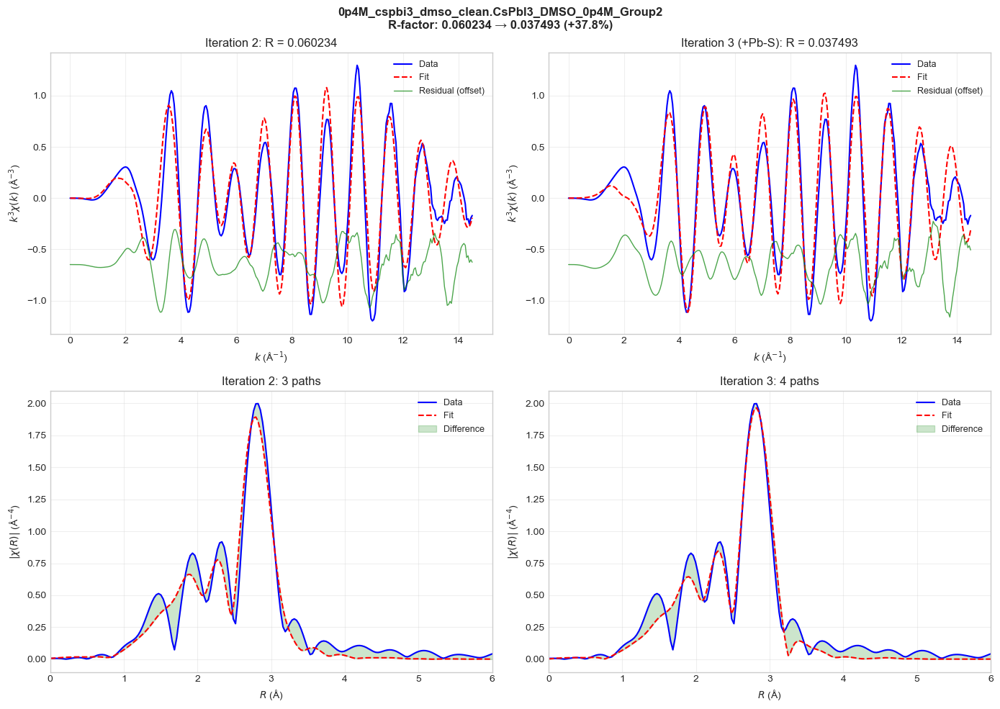


Project: 0p5M_cspbi3_dmso_clean

  Group: 0p5M_cspbi3_dmso_clean.CsPbI3_DMSO_0p5M_Group1
    Previous R-factor: 0.061126, paths: 3
Creating Fourier Transform parameters for unknown...
  Found optimized kmin = 2.40 (from ft_processing_batch)
  Found optimized kmax = 11.75 (from ft_processing_batch)
  Using rbkg reference = 1.06 A
  Using fit rmin = 1.69 A (detected)
  Created transform with k-range: 2.40 to 11.75 Å⁻¹, kw=3
    Current model AICc: 5.00 (Nind=16.1, k=6, RSS=5.9265)

Building linked parameter group for iteration 3
  Elements included: ['I', 'O', 'S']
  Updating from previous fit result
    s02 = 0.7800 (from amp)
    e0 = -3.3000 (from del_e0)
    N_I = 2.5206 (from n_PbI)
    sigma2_I = 0.0091 (from pbi_sig2)
    delr_I = -0.0141 (from pbi_delr)
  Parameter summary:
    s02 = 0.780 (vary=False)
    e0  = -3.300 (vary=True)
    N_I       = 2.521
    sigma2_I  = 0.0091
    delr_I    = -0.0141
    [Pb-O split-shell model]
    N_O1      = 4.054
    N_O2      = 1.559
    N_O_

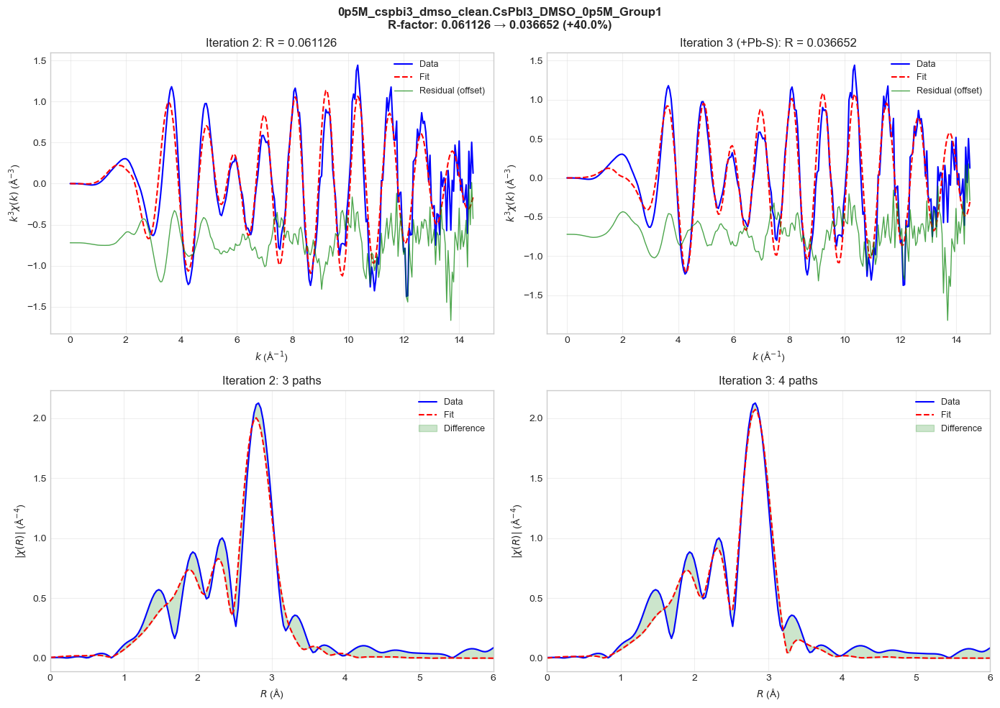


  Group: 0p5M_cspbi3_dmso_clean.CsPbI3_DMSO_0p5M_Group2
    Previous R-factor: 0.061418, paths: 3
Creating Fourier Transform parameters for unknown...
  Found optimized kmin = 2.45 (from ft_processing_batch)
  Found optimized kmax = 11.80 (from ft_processing_batch)
  Using rbkg reference = 1.06 A
  Using fit rmin = 1.69 A (detected)
  Created transform with k-range: 2.45 to 11.80 Å⁻¹, kw=3
    Current model AICc: 4.10 (Nind=16.1, k=6, RSS=5.6043)

Building linked parameter group for iteration 3
  Elements included: ['I', 'O', 'S']
  Updating from previous fit result
    s02 = 0.7800 (from amp)
    e0 = -3.3000 (from del_e0)
    N_I = 2.4198 (from n_PbI)
    sigma2_I = 0.0090 (from pbi_sig2)
    delr_I = -0.0144 (from pbi_delr)
  Parameter summary:
    s02 = 0.780 (vary=False)
    e0  = -3.300 (vary=True)
    N_I       = 2.420
    sigma2_I  = 0.0090
    delr_I    = -0.0144
    [Pb-O split-shell model]
    N_O1      = 4.087
    N_O2      = 1.572
    N_O_total = 5.658
    sigma2_O  = 0.0

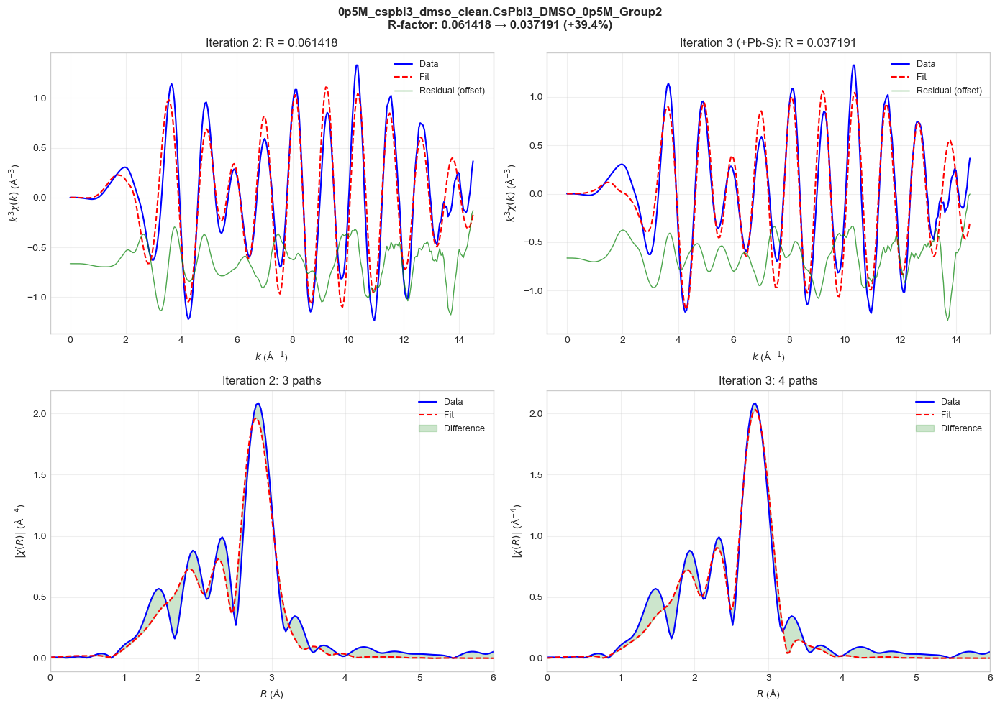


Project: 0p6M_cspbi3_dmso_clean

  Group: 0p6M_cspbi3_dmso_clean.CsPbI3_DMSO_0p6M_Group1
    Previous R-factor: 0.052377, paths: 3
Creating Fourier Transform parameters for unknown...
  Found optimized kmin = 2.35 (from ft_processing_batch)
  Found optimized kmax = 11.75 (from ft_processing_batch)
  Using rbkg reference = 1.18 A
  Using fit rmin = 1.69 A (detected)
  Created transform with k-range: 2.35 to 11.75 Å⁻¹, kw=3
    Current model AICc: -9.07 (Nind=16.2, k=6, RSS=2.5316)

Building linked parameter group for iteration 3
  Elements included: ['I', 'O', 'S']
  Updating from previous fit result
    s02 = 0.7800 (from amp)
    e0 = -3.3000 (from del_e0)
    N_I = 2.6436 (from n_PbI)
    sigma2_I = 0.0111 (from pbi_sig2)
    delr_I = -0.0184 (from pbi_delr)
  Parameter summary:
    s02 = 0.780 (vary=False)
    e0  = -3.300 (vary=True)
    N_I       = 2.644
    sigma2_I  = 0.0111
    delr_I    = -0.0184
    [Pb-O split-shell model]
    N_O1      = 3.239
    N_O2      = 1.246
    N_O

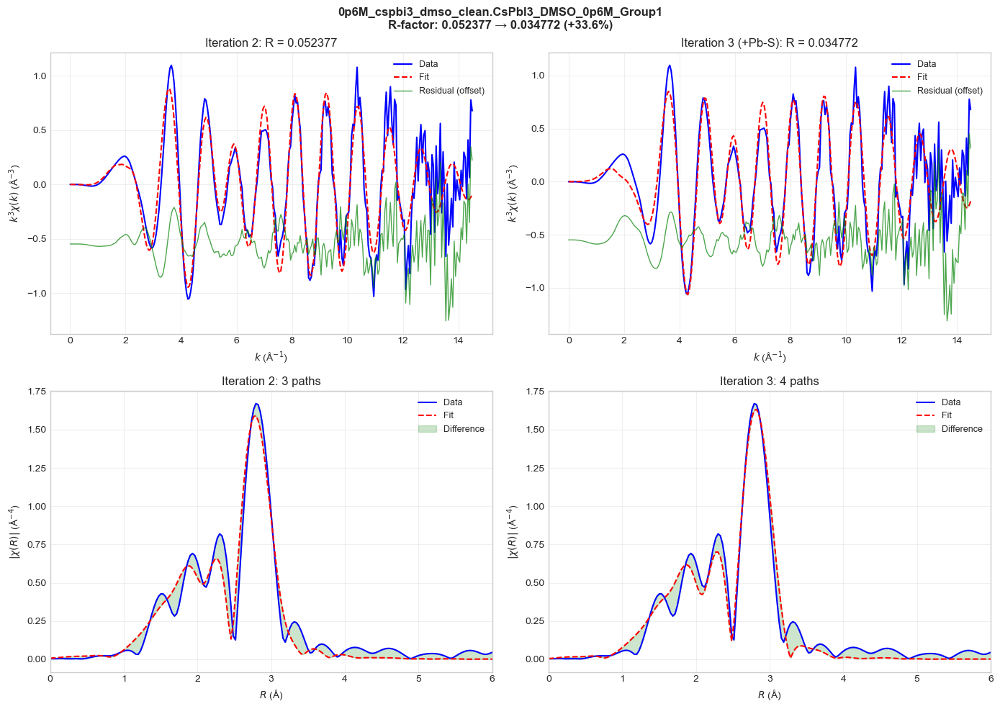


  Group: 0p6M_cspbi3_dmso_clean.CsPbI3_DMSO_0p6M_Group2
    Previous R-factor: 0.056958, paths: 3
Creating Fourier Transform parameters for unknown...
  Found optimized kmin = 2.40 (from ft_processing_batch)
  Found optimized kmax = 11.85 (from ft_processing_batch)
  Using rbkg reference = 1.18 A
  Using fit rmin = 1.69 A (detected)
  Created transform with k-range: 2.40 to 11.85 Å⁻¹, kw=3
    Current model AICc: -9.17 (Nind=16.3, k=6, RSS=2.5670)

Building linked parameter group for iteration 3
  Elements included: ['I', 'O', 'S']
  Updating from previous fit result
    s02 = 0.7800 (from amp)
    e0 = -3.3000 (from del_e0)
    N_I = 2.5342 (from n_PbI)
    sigma2_I = 0.0109 (from pbi_sig2)
    delr_I = -0.0198 (from pbi_delr)
  Parameter summary:
    s02 = 0.780 (vary=False)
    e0  = -3.300 (vary=True)
    N_I       = 2.534
    sigma2_I  = 0.0109
    delr_I    = -0.0198
    [Pb-O split-shell model]
    N_O1      = 3.280
    N_O2      = 1.261
    N_O_total = 4.541
    sigma2_O  = 0.

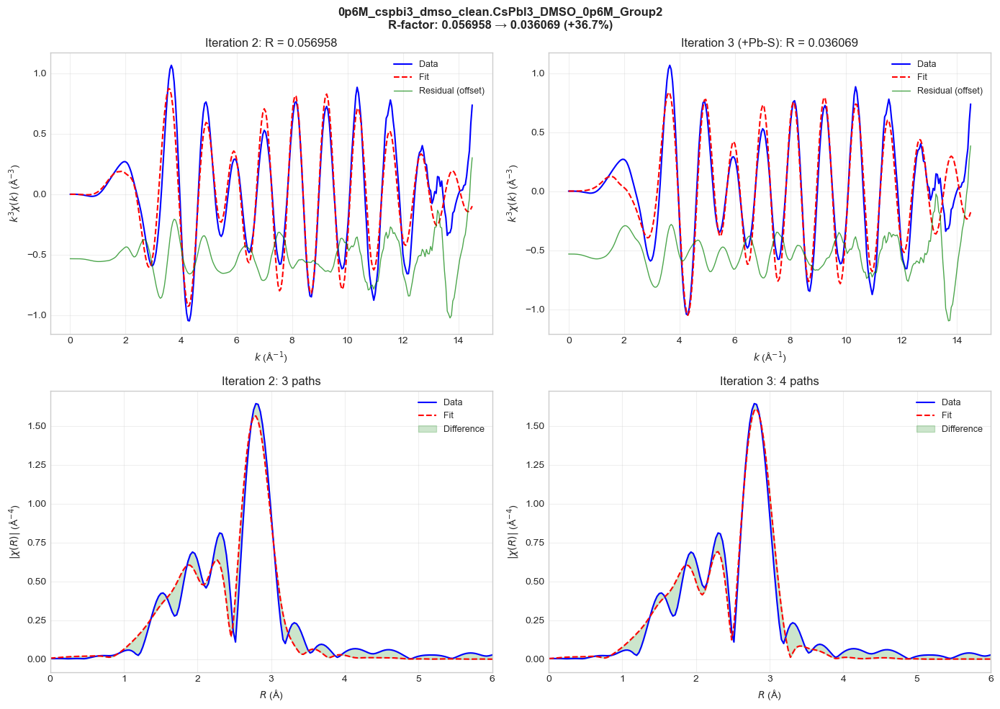


Project: 0p7M_cspbi3_dmso_clean

  Group: 0p7M_cspbi3_dmso_clean.CsPbI3_DMSO_0p7M_Group1_clean
    Previous R-factor: 0.065238, paths: 3
Creating Fourier Transform parameters for unknown...
  Found optimized kmin = 2.40 (from ft_processing_batch)
  Found optimized kmax = 11.75 (from ft_processing_batch)
  Using rbkg reference = 1.18 A
  Using fit rmin = 1.66 A (detected)
  Created transform with k-range: 2.40 to 11.75 Å⁻¹, kw=3
    Current model AICc: -3.96 (Nind=16.3, k=6, RSS=3.5411)

Building linked parameter group for iteration 3
  Elements included: ['I', 'O', 'S']
  Updating from previous fit result
    s02 = 0.7800 (from amp)
    e0 = -3.3000 (from del_e0)
    N_I = 2.3181 (from n_PbI)
    sigma2_I = 0.0098 (from pbi_sig2)
    delr_I = -0.0200 (from pbi_delr)
  Parameter summary:
    s02 = 0.780 (vary=False)
    e0  = -3.300 (vary=True)
    N_I       = 2.318
    sigma2_I  = 0.0098
    delr_I    = -0.0200
    [Pb-O split-shell model]
    N_O1      = 3.309
    N_O2      = 1.273
 

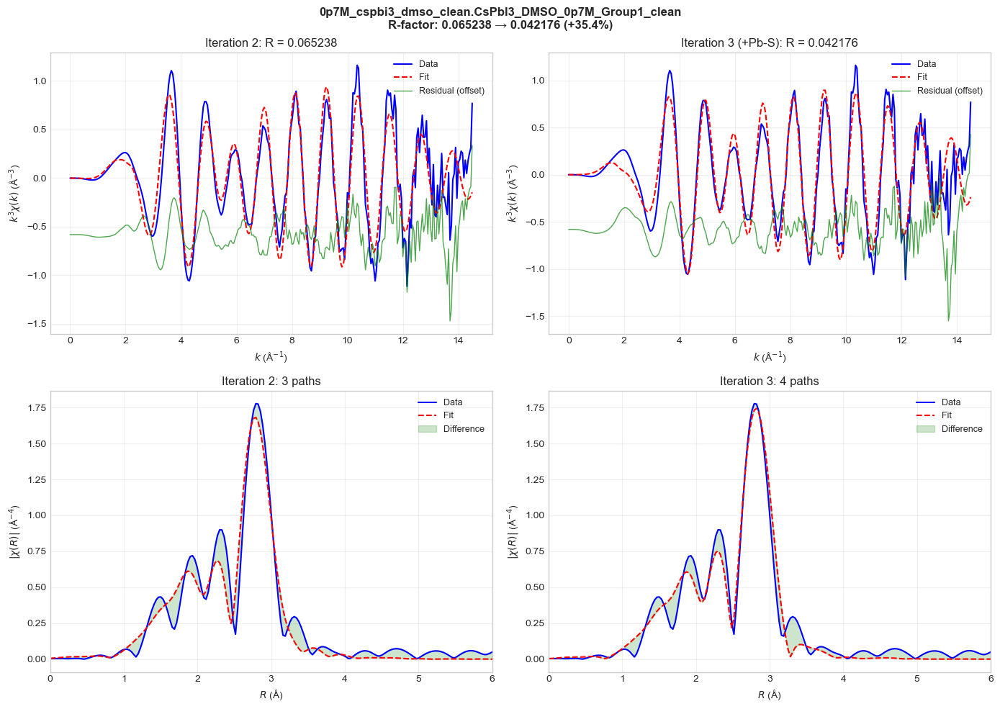


Project: 0p8M_cspbi3_dmso_clean

  Group: 0p8M_cspbi3_dmso_clean.CsPbI3_DMSO_0p8M_Group1
    Previous R-factor: 0.059496, paths: 3
Creating Fourier Transform parameters for unknown...
  Found optimized kmin = 2.40 (from ft_processing_batch)
  Found optimized kmax = 11.75 (from ft_processing_batch)
  Using rbkg reference = 1.06 A
  Using fit rmin = 1.69 A (detected)
  Created transform with k-range: 2.40 to 11.75 Å⁻¹, kw=3
    Current model AICc: 1.60 (Nind=16.1, k=6, RSS=4.8010)

Building linked parameter group for iteration 3
  Elements included: ['I', 'O', 'S']
  Updating from previous fit result
    s02 = 0.7800 (from amp)
    e0 = -3.3000 (from del_e0)
    N_I = 2.6431 (from n_PbI)
    sigma2_I = 0.0101 (from pbi_sig2)
    delr_I = -0.0144 (from pbi_delr)
  Parameter summary:
    s02 = 0.780 (vary=False)
    e0  = -3.300 (vary=True)
    N_I       = 2.643
    sigma2_I  = 0.0101
    delr_I    = -0.0144
    [Pb-O split-shell model]
    N_O1      = 3.859
    N_O2      = 1.484
    N_O_

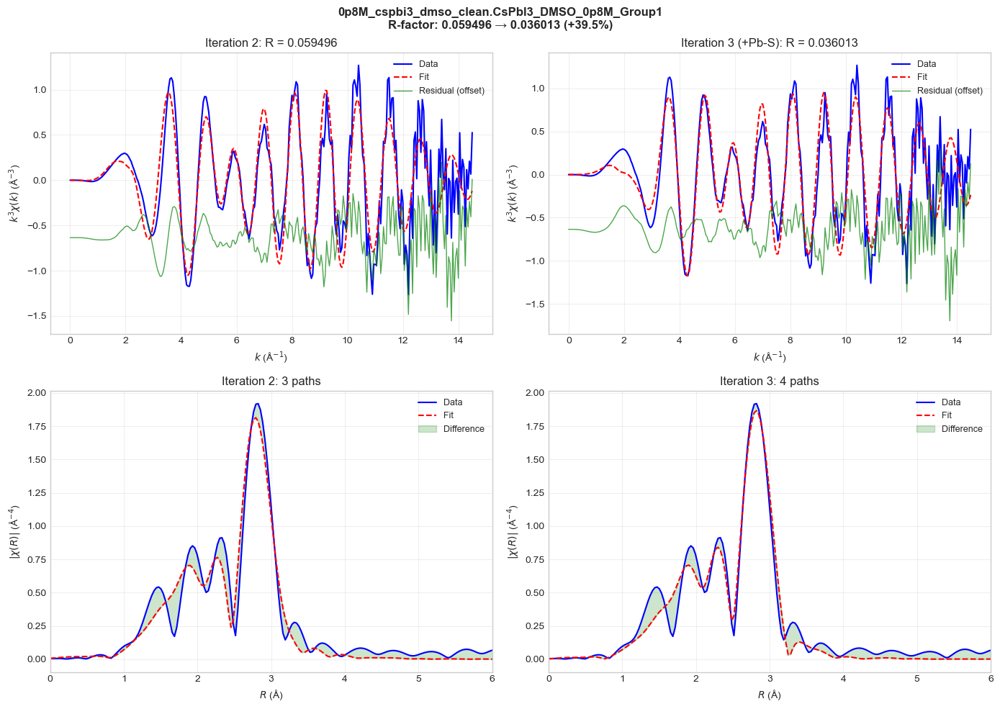


  Group: 0p8M_cspbi3_dmso_clean.CsPbI3_DMSO_0p8M_Group2
    Previous R-factor: 0.063998, paths: 3
Creating Fourier Transform parameters for unknown...
  Found optimized kmin = 2.40 (from ft_processing_batch)
  Found optimized kmax = 11.80 (from ft_processing_batch)
  Using rbkg reference = 1.06 A
  Using fit rmin = 1.69 A (detected)
  Created transform with k-range: 2.40 to 11.80 Å⁻¹, kw=3
    Current model AICc: 1.60 (Nind=16.2, k=6, RSS=4.8830)

Building linked parameter group for iteration 3
  Elements included: ['I', 'O', 'S']
  Updating from previous fit result
    s02 = 0.7800 (from amp)
    e0 = -3.3000 (from del_e0)
    N_I = 2.5342 (from n_PbI)
    sigma2_I = 0.0100 (from pbi_sig2)
    delr_I = -0.0158 (from pbi_delr)
  Parameter summary:
    s02 = 0.780 (vary=False)
    e0  = -3.300 (vary=True)
    N_I       = 2.534
    sigma2_I  = 0.0100
    delr_I    = -0.0158
    [Pb-O split-shell model]
    N_O1      = 3.891
    N_O2      = 1.497
    N_O_total = 5.388
    sigma2_O  = 0.0

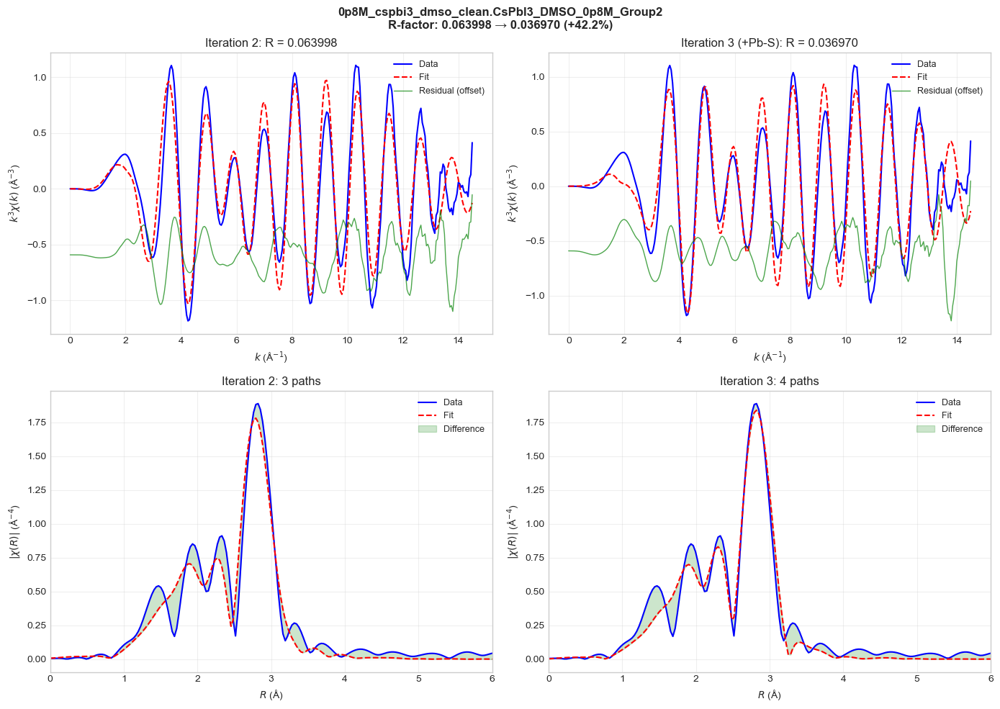


Project: 0p9M_cspbi3_dmso_clean

  Group: 0p9M_cspbi3_dmso_clean.CsPbI3_DMSO_0p9M_Group1
    Previous R-factor: 0.061526, paths: 3
Creating Fourier Transform parameters for unknown...
  Found optimized kmin = 2.35 (from ft_processing_batch)
  Found optimized kmax = 11.80 (from ft_processing_batch)
  Using rbkg reference = 1.18 A
  Using fit rmin = 1.69 A (detected)
  Created transform with k-range: 2.35 to 11.80 Å⁻¹, kw=3
    Current model AICc: -6.15 (Nind=16.3, k=6, RSS=3.0888)

Building linked parameter group for iteration 3
  Elements included: ['I', 'O', 'S']
  Updating from previous fit result
    s02 = 0.7800 (from amp)
    e0 = -3.3000 (from del_e0)
    N_I = 2.7230 (from n_PbI)
    sigma2_I = 0.0116 (from pbi_sig2)
    delr_I = -0.0191 (from pbi_delr)
  Parameter summary:
    s02 = 0.780 (vary=False)
    e0  = -3.300 (vary=True)
    N_I       = 2.723
    sigma2_I  = 0.0116
    delr_I    = -0.0191
    [Pb-O split-shell model]
    N_O1      = 3.334
    N_O2      = 1.282
    N_O

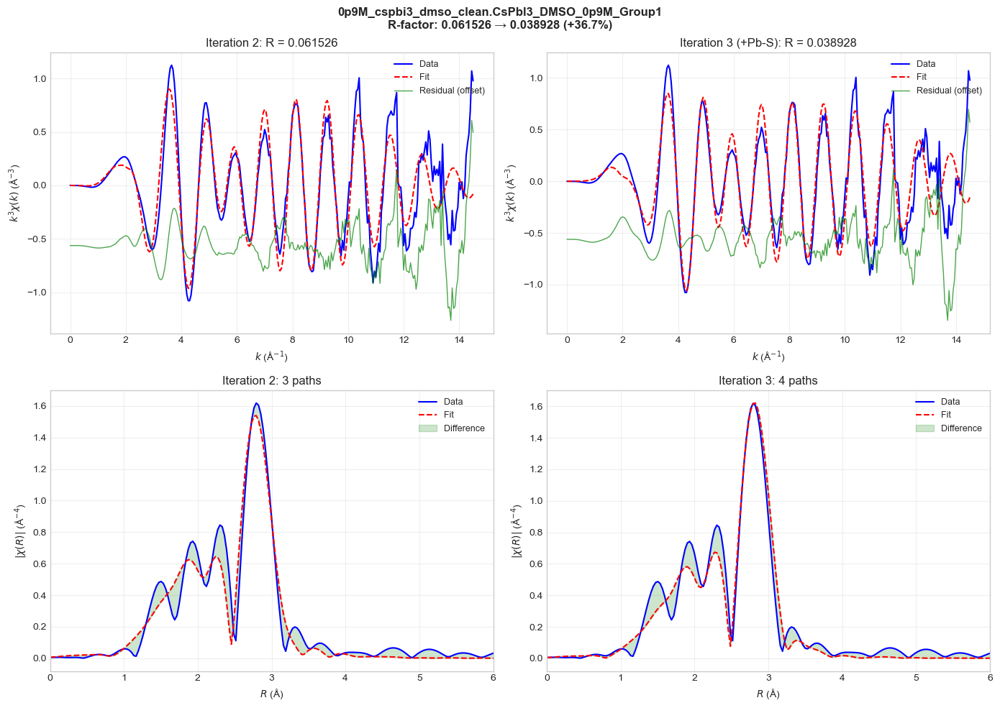


  Group: 0p9M_cspbi3_dmso_clean.CsPbI3_DMSO_0p9M_Group2
    Previous R-factor: 0.062993, paths: 3
Creating Fourier Transform parameters for unknown...
  Found optimized kmin = 2.35 (from ft_processing_batch)
  Found optimized kmax = 11.85 (from ft_processing_batch)
  Using rbkg reference = 1.18 A
  Using fit rmin = 1.69 A (detected)
  Created transform with k-range: 2.35 to 11.85 Å⁻¹, kw=3
    Current model AICc: -7.31 (Nind=16.4, k=6, RSS=2.9332)

Building linked parameter group for iteration 3
  Elements included: ['I', 'O', 'S']
  Updating from previous fit result
    s02 = 0.7800 (from amp)
    e0 = -3.3000 (from del_e0)
    N_I = 2.6394 (from n_PbI)
    sigma2_I = 0.0115 (from pbi_sig2)
    delr_I = -0.0195 (from pbi_delr)
  Parameter summary:
    s02 = 0.780 (vary=False)
    e0  = -3.300 (vary=True)
    N_I       = 2.639
    sigma2_I  = 0.0115
    delr_I    = -0.0195
    [Pb-O split-shell model]
    N_O1      = 3.340
    N_O2      = 1.285
    N_O_total = 4.625
    sigma2_O  = 0.

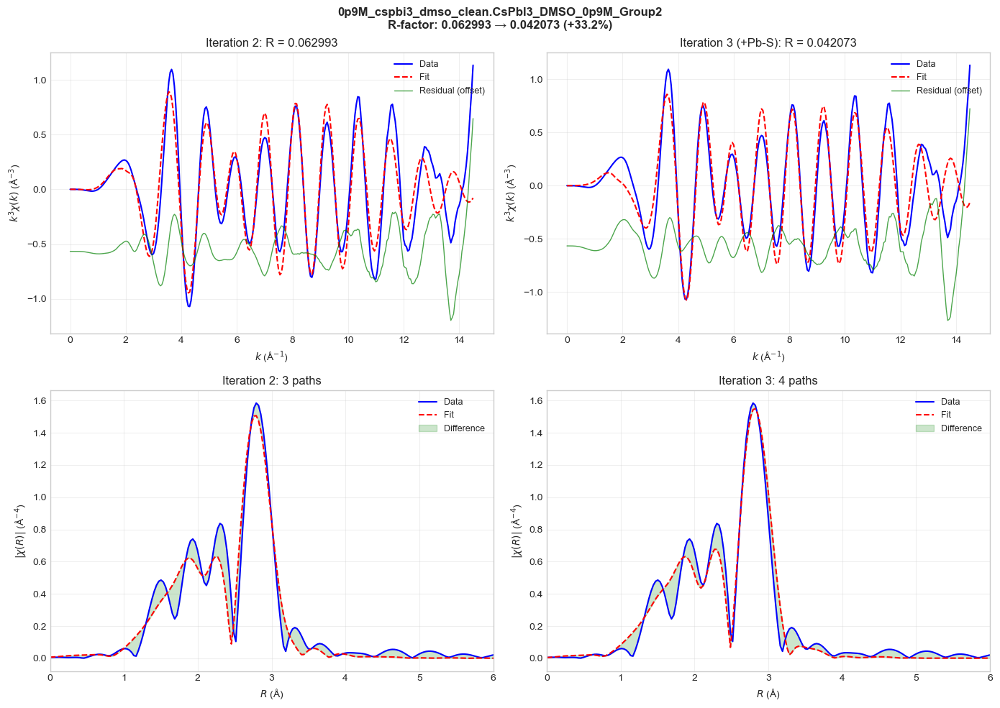


Project: 1p0M_cspbi3_dmso_clean

  Group: 1p0M_cspbi3_dmso_clean.CsPbI3_DMSO_1p0M_Group1
    Previous R-factor: 0.057868, paths: 3
Creating Fourier Transform parameters for unknown...
  Found optimized kmin = 2.40 (from ft_processing_batch)
  Found optimized kmax = 11.85 (from ft_processing_batch)
  Using rbkg reference = 1.06 A
  Using fit rmin = 1.69 A (detected)
  Created transform with k-range: 2.40 to 11.85 Å⁻¹, kw=3
    Current model AICc: -3.01 (Nind=16.3, k=6, RSS=3.7436)

Building linked parameter group for iteration 3
  Elements included: ['I', 'O', 'S']
  Updating from previous fit result
    s02 = 0.7800 (from amp)
    e0 = -3.3000 (from del_e0)
    N_I = 2.5534 (from n_PbI)
    sigma2_I = 0.0114 (from pbi_sig2)
    delr_I = -0.0193 (from pbi_delr)
  Parameter summary:
    s02 = 0.780 (vary=False)
    e0  = -3.300 (vary=True)
    N_I       = 2.553
    sigma2_I  = 0.0114
    delr_I    = -0.0193
    [Pb-O split-shell model]
    N_O1      = 3.314
    N_O2      = 1.275
    N_O

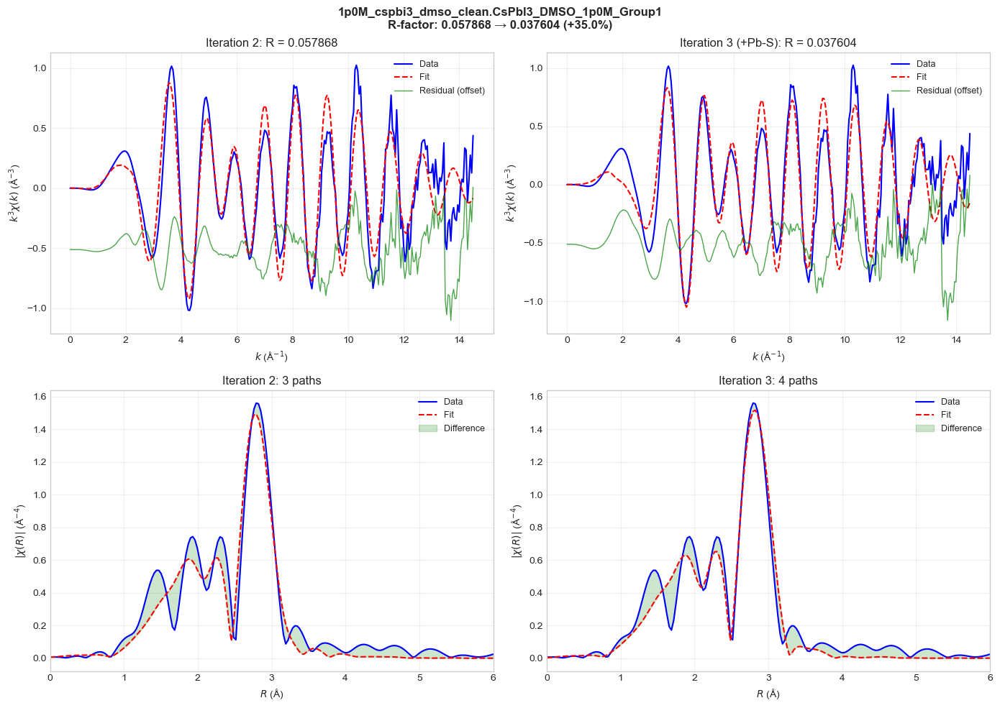


  Group: 1p0M_cspbi3_dmso_clean.CsPbI3_DMSO_1p0M_Group2
    Previous R-factor: 0.062021, paths: 3
Creating Fourier Transform parameters for unknown...
  Found optimized kmin = 2.40 (from ft_processing_batch)
  Found optimized kmax = 11.85 (from ft_processing_batch)
  Using rbkg reference = 1.06 A
  Using fit rmin = 1.69 A (detected)
  Created transform with k-range: 2.40 to 11.85 Å⁻¹, kw=3
    Current model AICc: -2.57 (Nind=16.3, k=6, RSS=3.8476)

Building linked parameter group for iteration 3
  Elements included: ['I', 'O', 'S']
  Updating from previous fit result
    s02 = 0.7800 (from amp)
    e0 = -3.3000 (from del_e0)
    N_I = 2.4798 (from n_PbI)
    sigma2_I = 0.0113 (from pbi_sig2)
    delr_I = -0.0207 (from pbi_delr)
  Parameter summary:
    s02 = 0.780 (vary=False)
    e0  = -3.300 (vary=True)
    N_I       = 2.480
    sigma2_I  = 0.0113
    delr_I    = -0.0207
    [Pb-O split-shell model]
    N_O1      = 3.334
    N_O2      = 1.282
    N_O_total = 4.616
    sigma2_O  = 0.

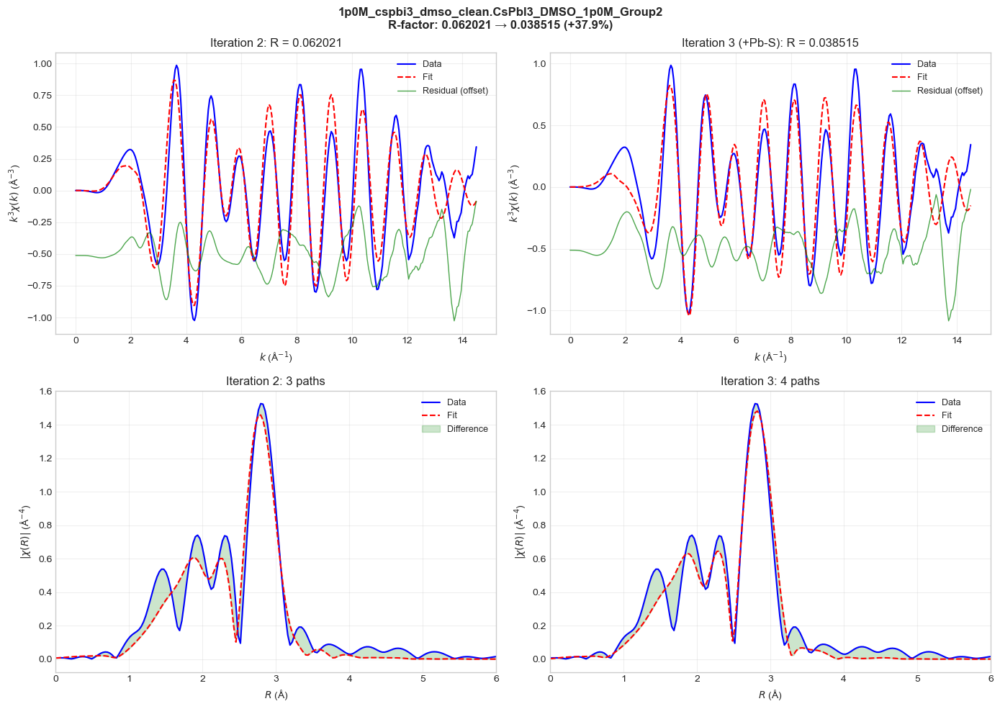


Project: 1p2M_cspbi3_dmso_clean

  Group: 1p2M_cspbi3_dmso_clean.CsPbI3_DMSO_1p2M_Group1
    Previous R-factor: 0.118479, paths: 3
Creating Fourier Transform parameters for unknown...
  Found optimized kmin = 2.35 (from ft_processing_batch)
  Found optimized kmax = 11.95 (from ft_processing_batch)
  Using rbkg reference = 1.06 A
  Using fit rmin = 1.63 A (detected)
  Created transform with k-range: 2.35 to 11.95 Å⁻¹, kw=3
    Current model AICc: 6.83 (Nind=17.0, k=6, RSS=7.5960)

Building linked parameter group for iteration 3
  Elements included: ['I', 'O', 'S']
  Updating from previous fit result
    s02 = 0.7800 (from amp)
    e0 = -3.3000 (from del_e0)
    N_I = 3.2664 (from n_PbI)
    sigma2_I = 0.0126 (from pbi_sig2)
    delr_I = -0.0018 (from pbi_delr)
  Parameter summary:
    s02 = 0.780 (vary=False)
    e0  = -3.300 (vary=True)
    N_I       = 3.266
    sigma2_I  = 0.0126
    delr_I    = -0.0018
    [Pb-O split-shell model]
    N_O1      = 4.843
    N_O2      = 1.863
    N_O_

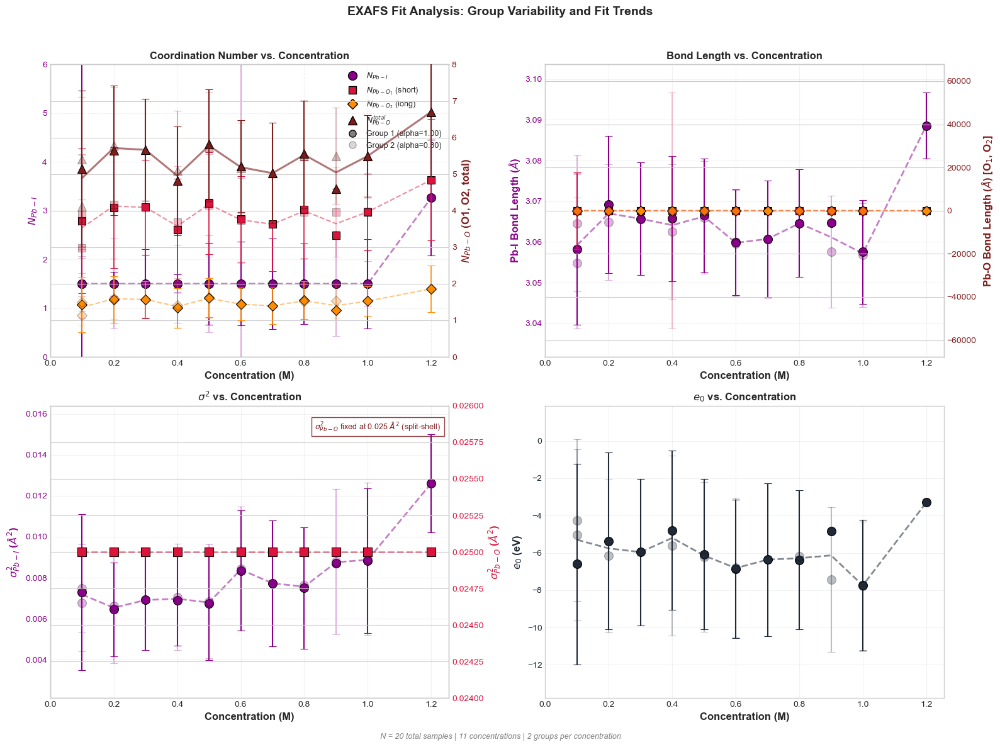


PLOT_FIT_2X2_SUMMARY
  Total groups:      20
  Concentrations:    11
  Figure saved:      Not saved
--------------------------------------------------------------------------------
  Per-concentration summary:
    Conc 0.100 M: 3 groups, avg N_I=1.50, avg N_Pb-O1=3.53, avg N_Pb-O2=1.36, avg N_Pb-O(total)=4.89, avg sigma2_I=0.00718, sigma2_Pb-O=0.02500 (FIXED), avg e0=-5.297
    Conc 0.200 M: 2 groups, avg N_I=1.50, avg N_Pb-O1=4.13, avg N_Pb-O2=1.59, avg N_Pb-O(total)=5.71, avg sigma2_I=0.00654, sigma2_Pb-O=0.02500 (FIXED), avg e0=-5.762
    Conc 0.300 M: 1 groups, avg N_I=1.50, avg N_Pb-O1=4.09, avg N_Pb-O2=1.57, avg N_Pb-O(total)=5.66, avg sigma2_I=0.00691, sigma2_Pb-O=0.02500 (FIXED), avg e0=-5.959
    Conc 0.400 M: 2 groups, avg N_I=1.50, avg N_Pb-O1=3.58, avg N_Pb-O2=1.38, avg N_Pb-O(total)=4.96, avg sigma2_I=0.00698, sigma2_Pb-O=0.02500 (FIXED), avg e0=-5.198
    Conc 0.500 M: 2 groups, avg N_I=1.50, avg N_Pb-O1=4.17, avg N_Pb-O2=1.61, avg N_Pb-O(total)=5.78, avg sigma2_I=0.0067

In [7]:

# 4. Add Pb-S, forcing one path per model
results_pbs = cspbi3_fit.iterative_fit_linked_all(
    feff_category='Pb-S',
    iteration=3,
    feff_base_dir=feff_dir,
    include_ms=False,
    max_paths_to_add=1,
    verbose=True,
    force_add_path=False,
    force_add_min_paths=0,
    physical_sanity_mode='off',
    require_valid_aicc=False,
    allow_rfactor_fallback=True,
    reject_on_bound_pinning=False,
    vary_e0 = True,
    pb_o_model='split_two_shell'
)
fig, axes = cspbi3_fit.plot_fit_2x2_summary(
    figsize=(16, 12),
    dpi=300,
    save_path=None,
    n_groups=2,
)


In [ ]:

# 5. Replace 
cspbi3_fit.replace_large_delr_paths(
    iteration=3,
    feff_base_dir=feff_dir,
    delr_threshold=0.08,
    improvement_tolerance=0.0005,
    target_param_types=['SS_O'],
    strict_scatterers=False,
    max_candidates_per_path=8,
    max_total_replacements_per_group=1,
    require_delr_improvement=True,
    sanity_scope='off',
    require_valid_aicc=False,
    allow_rfactor_fallback=True,
    reject_on_bound_pinning=False,
    verbose=True,
    plot_results=False,
    vary_e0 = True
)
cspbi3_fit.replace_large_delr_paths(
    iteration=3,
    feff_base_dir=feff_dir,
    delr_threshold=0.08,
    improvement_tolerance=0.0005,
    target_param_types=['SS_I'],
    strict_scatterers=False,
    max_candidates_per_path=8,
    max_total_replacements_per_group=1,
    require_delr_improvement=True,
    sanity_scope='off',
    require_valid_aicc=False,
    allow_rfactor_fallback=True,
    reject_on_bound_pinning=False,
    verbose=True,
    plot_results=False,
    vary_e0 = True
)
fig, axes = cspbi3_fit.plot_fit_2x2_summary(
    figsize=(16, 12),
    dpi=300,
    save_path=None,
    n_groups=2,
)


In [ ]:
#  Add Pb-C
results_pbs = cspbi3_fit.iterative_fit_linked_all(
    feff_category='Pb-Cs',
    iteration=4,
    feff_base_dir=feff_dir,
    include_ms=False,
    max_paths_to_add=1,
    verbose=True,
    force_add_path=False,
    force_add_min_paths=1,
    physical_sanity_mode='off',
    require_valid_aicc=True,
    allow_rfactor_fallback=True,
    reject_on_bound_pinning=False,
    vary_e0 = True,
    pb_o_model='split_two_shell',
)
fig, axes = cspbi3_fit.plot_fit_2x2_summary(
    figsize=(16, 12),
    dpi=300,
    save_path=None,
    n_groups=2,
)

In [ ]:
# replace
cspbi3_fit.replace_large_delr_paths(
    iteration=4,
    feff_base_dir=feff_dir,
    delr_threshold=0.08,
    improvement_tolerance=0.0005,
    target_param_types=['SS_O'],
    strict_scatterers=False,
    max_candidates_per_path=8,
    max_total_replacements_per_group=1,
    require_delr_improvement=True,
    sanity_scope='off',
    require_valid_aicc=False,
    allow_rfactor_fallback=True,
    reject_on_bound_pinning=False,
    verbose=True,
    plot_results=False,
    vary_e0 = True
)
cspbi3_fit.replace_large_delr_paths(
    iteration=4,
    feff_base_dir=feff_dir,
    delr_threshold=0.08,
    improvement_tolerance=0.0005,
    target_param_types=['SS_I'],
    strict_scatterers=False,
    max_candidates_per_path=8,
    max_total_replacements_per_group=1,
    require_delr_improvement=True,
    sanity_scope='off',
    require_valid_aicc=False,
    allow_rfactor_fallback=True,
    reject_on_bound_pinning=False,
    verbose=True,
    plot_results=False,
    vary_e0 = True
)

cspbi3_fit.replace_large_delr_paths(
    iteration=4,
    feff_base_dir=feff_dir,
    delr_threshold=0.08,
    improvement_tolerance=0.0005,
    target_param_types=['SS_S'],
    strict_scatterers=False,
    max_candidates_per_path=8,
    max_total_replacements_per_group=1,
    require_delr_improvement=True,
    sanity_scope='off',
    require_valid_aicc=False,
    allow_rfactor_fallback=True,
    reject_on_bound_pinning=False,
    verbose=True,
    plot_results=False,
    vary_e0 = True
)
cspbi3_fit.replace_large_delr_paths(
    iteration=4,
    feff_base_dir=feff_dir,
    delr_threshold=0.08,
    improvement_tolerance=0.0005,
    target_param_types=['SS_C'],
    strict_scatterers=False,
    max_candidates_per_path=8,
    max_total_replacements_per_group=1,
    require_delr_improvement=True,
    sanity_scope='off',
    require_valid_aicc=False,
    allow_rfactor_fallback=True,
    reject_on_bound_pinning=False,
    verbose=True,
    plot_results=False,
    vary_e0 = True
)
fig, axes = cspbi3_fit.plot_fit_2x2_summary(
    figsize=(16, 12),
    dpi=300,
    save_path=None,
    n_groups=2,
)


In [ ]:


# 6. Add MS
cspbi3_fit.iterative_fit_linked_all(
    feff_category='MS',
    iteration=5,
    feff_base_dir=feff_dir,
    include_ms=True,
    max_paths_to_add=2,
    verbose=True,
    physical_sanity_mode='off',
    require_valid_aicc=True,
    allow_rfactor_fallback=True,
    vary_e0=True,
    pb_o_model='split_two_shell',
)
fig, axes = cspbi3_fit.plot_fit_2x2_summary(
    figsize=(16, 12),
    dpi=300,
    save_path=None,
    n_groups=2,
)


In [ ]:
# replace

cspbi3_fit.replace_large_delr_paths(
    iteration=5,
    feff_base_dir=feff_dir,
    delr_threshold=0.08,
    improvement_tolerance=0.0005,
    target_param_types=['SS_I'],
    strict_scatterers=False,
    max_candidates_per_path=8,
    max_total_replacements_per_group=1,
    require_delr_improvement=True,
    sanity_scope='off',
    require_valid_aicc=False,
    allow_rfactor_fallback=True,
    reject_on_bound_pinning=False,
    verbose=True,
    plot_results=False,
    vary_e0 = True
)

cspbi3_fit.replace_large_delr_paths(
    iteration=5,
    feff_base_dir=feff_dir,
    delr_threshold=0.08,
    improvement_tolerance=0.0005,
    target_param_types=['SS_S'],
    strict_scatterers=False,
    max_candidates_per_path=8,
    max_total_replacements_per_group=1,
    require_delr_improvement=True,
    sanity_scope='off',
    require_valid_aicc=False,
    allow_rfactor_fallback=True,
    reject_on_bound_pinning=False,
    verbose=True,
    plot_results=False,
    vary_e0 = True
)
cspbi3_fit.replace_large_delr_paths(
    iteration=5,
    feff_base_dir=feff_dir,
    delr_threshold=0.08,
    improvement_tolerance=0.0005,
    target_param_types=['SS_C'],
    strict_scatterers=False,
    max_candidates_per_path=8,
    max_total_replacements_per_group=1,
    require_delr_improvement=True,
    sanity_scope='off',
    require_valid_aicc=False,
    allow_rfactor_fallback=True,
    reject_on_bound_pinning=False,
    verbose=True,
    plot_results=False,
    vary_e0 = True
)

cspbi3_fit.replace_large_delr_paths(
    iteration=5,
    feff_base_dir=feff_dir,
    delr_threshold=0.08,
    improvement_tolerance=0.0005,
    target_param_types=['SS_O'],
    strict_scatterers=False,
    max_candidates_per_path=8,
    max_total_replacements_per_group=1,
    require_delr_improvement=True,
    sanity_scope='off',
    require_valid_aicc=False,
    allow_rfactor_fallback=True,
    reject_on_bound_pinning=False,
    verbose=True,
    plot_results=False,
    vary_e0 = True
)

fig, axes = cspbi3_fit.plot_fit_2x2_summary(
    figsize=(16, 12),
    dpi=300,
    save_path=None,
    n_groups=2,
)


In [ ]:
cspbi3_fit.show_integrated_fit_paths()
cspbi3_fit.show_integrated_fit_paths(latest_only=False)
summary = cspbi3_fit.show_integrated_fit_paths(verbose=False)


In [ ]:
cspbi3_fit.plot_group_transparency_figure(
    figsize=(12, 10),      # Figure size
    dpi=300,               # Resolution for saved figure
    save_path=None,        # Path to save (None = display only)
    n_groups=3,            # Expected groups per concentration
    alpha_range=(1.0, 0.3) # (group1 alpha, group3 alpha)
)

cspbi3_fit.plot_publication_figure(
    figsize=(16, 12),        # Figure dimensions
    dpi=300,                 # Resolution for saving
    save_path='figure.png',  # None to display only
    include_paths_panel=True # Show path contributions
)

In [ ]:
# Replace any remaining large delr paths
cspbi3_fit.replace_large_delr_paths(
    iteration=5,
    feff_base_dir=feff_dir,
    delr_threshold=0.06,
    improvement_tolerance=0.0005,
    target_param_types=['SS_O', 'SS_I', 'SS_S', 'SS_C'],
    strict_scatterers=False,
    max_candidates_per_path=8,
    max_total_replacements_per_group=1,
    require_delr_improvement=True,
    sanity_scope='off',
    require_valid_aicc=False,
    allow_rfactor_fallback=False,
    reject_on_bound_pinning=False,
    verbose=True,
    plot_results=True,
    vary_e0=True
)
fig, axes = cspbi3_fit.plot_fit_2x2_summary(
    figsize=(16, 12),
    dpi=300,
    save_path=None,
    n_groups=2,
)


In [ ]:

results_pbs = cspbi3_fit.iterative_fit_linked_all(
    feff_category='Pb-S',
    iteration=6,
    feff_base_dir=feff_dir,
    include_ms=False,
    max_paths_to_add=1,
    verbose=True,
    force_add_path=False,
    force_add_min_paths=1,
    physical_sanity_mode='off',
    require_valid_aicc=True,
    allow_rfactor_fallback=True,
    reject_on_bound_pinning=False,
    pb_o_model='split_two_shell',
)
fig, axes = cspbi3_fit.plot_fit_2x2_summary(
    figsize=(16, 12),
    dpi=300,
    save_path=None,
    n_groups=2,
)

In [ ]:
cspbi3_fit.replace_large_delr_paths(
    iteration=5,
    feff_base_dir=feff_dir,
    delr_threshold=0.06,
    improvement_tolerance=0.0005,
    target_param_types=['Pb-S'],
    strict_scatterers=False,
    max_candidates_per_path=8,
    max_total_replacements_per_group=1,
    require_delr_improvement=True,
    sanity_scope='off',
    require_valid_aicc=False,
    allow_rfactor_fallback=False,
    reject_on_bound_pinning=False,
    verbose=True,
    plot_results=True,
)
fig, axes = cspbi3_fit.plot_fit_2x2_summary(
    figsize=(16, 12),
    dpi=300,
    save_path=None,
    n_groups=2,
)
